# Convolutional Neural Network for Feature Extraction Trained on Low Resolution Images

It is time to start building models. In this notebook I will be building CNN models and train them on low resolution images. These models will be further used for feature extraction for unsupervised models clustering similar images together. I will experiment by adding more convolutional or dense layer, changing number of neurons per layer and trying different activation functions. For unsupervised model I will be using BallTree (a variation of unsupervised Nearest Neighbors algorithm) that has an easy implementation in sklearn. The purpose here is to explore different options and to see how they will change the results.

It should be noticed that that there is no numeric metric that can be used to evaluate the goodness of CNN models.I will be checking accuracy to show that nearly all of them provide very similar results. The data has 38 binary encoded attributes with not equal representation and accuracy will be in general high. But since I intend to use the CNN models for feature extraction, accuracy in this case is not something to look after. Instead I will be testing visual results for 5 test images pre-selected earlier. And based on the visual similarities score the models.

I will start slowly to make sure my machine can handle the volume. I will first build a model with 2 convolutional layers (1 input and one hidden) and start training and testing on low res images. I am using sequential framework for the model as there is defined input (image data) and defined output(feature vector with probabilities for 38 attributes). 

The labeled data was previously split in train, validation and split, and I will be using ImageDataGenerator from keras to preprocess it before feeding to network. It is an efficient way as it builds data denerator and helps to save computational space in comparison to using numpy arrays.

In [1]:
# import packages
import pandas as pd
import numpy as np
import random
import os
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

import keras
from keras.preprocessing.image import ImageDataGenerator, image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense

from sklearn.neighbors import BallTree

from timeit import default_timer as timer
from datetime import timedelta
from time import sleep
from tqdm import tqdm

Using TensorFlow backend.


In [2]:
# load train, validation and test sets
train_data = pd.read_csv('data/train_images.csv', header=0)
validation_data = pd.read_csv('data/validation_images.csv', header=0)
test_data = pd.read_csv('data/test_images.csv', header=0)

# load two sets of unlabeled data for further model testing
test_dresses_small = pd.read_csv('data/test_dresses_small.csv', header=0)
test_dresses_large = pd.read_csv('data/test_dresses_large.csv', header=0)

notebook_start=timer()

print('Relevant dataframes loaded')

Relevant dataframes loaded


In [3]:
# create training, validation and testing data generators
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        width_shift_range=0.2, 
        height_shift_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True, 
        vertical_flip=True)

attr_columns = list(train_data.drop(['url', 'Unnamed: 0', 'short_path', 'low_res_url'], axis=1).columns)

train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory='data/cropped_images_300x200/',
        x_col='short_path',
        y_col=attr_columns,
        target_size=(300, 200),
        batch_size=32,
        class_mode='raw')

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
        dataframe=test_data,
        directory='data/cropped_images_300x200/',
        x_col='short_path',
        y_col=attr_columns,
        target_size=(300, 200),
        batch_size=32,
        class_mode='raw')

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
        dataframe=validation_data,
        directory='data/cropped_images_300x200/',
        x_col='short_path',
        y_col=attr_columns,
        target_size=(300, 200),
        batch_size=32,
        class_mode='raw')



Found 40277 validated image filenames.
Found 11651 validated image filenames.
Found 9486 validated image filenames.


The next step is to define, compile and train the model. As mentioned earlier this model will have two convolutional layers, each followed by pooling layer. I am using 3x3 kernel (but keeping the same pixel quanties after each convolution ~ padding='same') and RELU as activation function. The problem is a multilabel classification and therefore sigmoid function is an appropriate activation for the output layer and binary_crossentropy will be used as a loss function.

In [4]:
# define a model
model = Sequential()
n_row = 300
n_col = 200
n_output = len(attr_columns)
model.add(Conv2D(10, kernel_size=3, activation='relu', padding = 'same', input_shape=[n_row,n_col,3]))
model.add(BatchNormalization())
model.add(MaxPooling2D(2))
model.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling2D(2))
model.add(Flatten())
model.add(Dense(38, activation='sigmoid'))

In [5]:
# compile model
model.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [6]:
# train the model
start = timer()
history = model.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('First model trained in ',timedelta(seconds=end-start))


Epoch 1/20
10/10 [==============================] - ETA: 23s - loss: 0.7019 - accuracy: 0.499 - ETA: 15s - loss: 1.9780 - accuracy: 0.721 - ETA: 11s - loss: 2.8946 - accuracy: 0.794 - ETA: 9s - loss: 3.1474 - accuracy: 0.832 - ETA: 7s - loss: 3.2879 - accuracy: 0.85 - ETA: 5s - loss: 3.4259 - accuracy: 0.86 - ETA: 4s - loss: 3.3551 - accuracy: 0.87 - ETA: 2s - loss: 3.3573 - accuracy: 0.88 - ETA: 1s - loss: 3.2915 - accuracy: 0.88 - 17s 2s/step - loss: 3.1671 - accuracy: 0.8895 - val_loss: 0.7744 - val_accuracy: 0.9064
Epoch 2/20
10/10 [==============================] - ETA: 14s - loss: 2.3151 - accuracy: 0.903 - ETA: 13s - loss: 2.2376 - accuracy: 0.905 - ETA: 11s - loss: 2.0587 - accuracy: 0.908 - ETA: 9s - loss: 2.0185 - accuracy: 0.910 - ETA: 7s - loss: 1.8828 - accuracy: 0.91 - ETA: 6s - loss: 1.8267 - accuracy: 0.91 - ETA: 4s - loss: 1.7746 - accuracy: 0.90 - ETA: 3s - loss: 1.7041 - accuracy: 0.90 - ETA: 1s - loss: 1.6070 - accuracy: 0.91 - 18s 2s/step - loss: 1.5079 - accuracy:

10/10 [==============================] - ETA: 14s - loss: 0.2154 - accuracy: 0.935 - ETA: 12s - loss: 0.2111 - accuracy: 0.942 - ETA: 10s - loss: 0.2116 - accuracy: 0.941 - ETA: 9s - loss: 0.2080 - accuracy: 0.941 - ETA: 7s - loss: 0.2103 - accuracy: 0.94 - ETA: 6s - loss: 0.2053 - accuracy: 0.94 - ETA: 4s - loss: 0.2078 - accuracy: 0.94 - ETA: 3s - loss: 0.2067 - accuracy: 0.94 - ETA: 1s - loss: 0.2081 - accuracy: 0.94 - 17s 2s/step - loss: 0.2077 - accuracy: 0.9419 - val_loss: 0.1855 - val_accuracy: 0.9493
Epoch 17/20
10/10 [==============================] - ETA: 14s - loss: 0.1856 - accuracy: 0.949 - ETA: 12s - loss: 0.1867 - accuracy: 0.950 - ETA: 10s - loss: 0.1878 - accuracy: 0.949 - ETA: 9s - loss: 0.1925 - accuracy: 0.946 - ETA: 7s - loss: 0.1944 - accuracy: 0.94 - ETA: 6s - loss: 0.1955 - accuracy: 0.94 - ETA: 4s - loss: 0.1950 - accuracy: 0.94 - ETA: 3s - loss: 0.1926 - accuracy: 0.94 - ETA: 1s - loss: 0.1959 - accuracy: 0.94 - 17s 2s/step - loss: 0.1959 - accuracy: 0.9452 - 

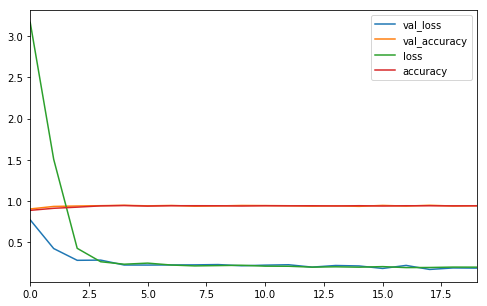

In [7]:
# print loss and accuracy scores during training
pd.DataFrame(history.history).plot(figsize=[8,5])
plt.show()

In [8]:
# evaluate model on test data
model.evaluate_generator(test_generator)

[0.1258840709924698, 0.9447391629219055]

In [9]:
# predict labels for test data
predicted1 = model.predict_generator(test_generator)

It should be noticed that accuracy for train, validation and test data are at about 94% and has not seen much improvement since the first epoch. This justifies the fact that the metric is irrelevant here and it is better to compare models visually. 

Let's build model #2.

There are 38 different attributes that are used to describe dresses. However, not all of them are represented equally, therefore adding class weights to the model. I will build the model the same way otherwise to explore if adding class weights makes a difference.

In [10]:
# since classes are imbalanced I am introducing class weights
dresses = pd.read_csv('data/dress_attributes.csv', header=0)
class_weight = dresses.sum(axis=0, skipna=True, numeric_only=True)
class_weight = class_weight/len(dresses)
class_weights = dict(zip(np.arange(38), class_weight.values))

In [11]:
# define a model
model2 = Sequential()
n_row = 300
n_col = 200
n_output = len(attr_columns)
model2.add(Conv2D(10, kernel_size=3, activation='relu', padding = 'same', input_shape=[n_row,n_col,3]))
model2.add(BatchNormalization())
model2.add(MaxPooling2D(2))
model2.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model2.add(MaxPooling2D(2))
model2.add(Flatten())
model2.add(Dense(38, activation='sigmoid'))

In [12]:
# compile model
model2.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [13]:
# train the model
start = timer()
history = model2.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5, class_weight=class_weights)

end = timer()
print('Model#2 trained in ',timedelta(seconds=end-start))


Epoch 1/20
10/10 [==============================] - ETA: 19s - loss: 6418.0439 - accuracy: 0.48 - ETA: 14s - loss: 7168.1692 - accuracy: 0.70 - ETA: 11s - loss: 8094.7085 - accuracy: 0.77 - ETA: 9s - loss: 8871.8922 - accuracy: 0.8172 - ETA: 7s - loss: 9719.3522 - accuracy: 0.838 - ETA: 6s - loss: 12184.2408 - accuracy: 0.84 - ETA: 4s - loss: 11436.8830 - accuracy: 0.85 - ETA: 3s - loss: 11254.6691 - accuracy: 0.86 - ETA: 1s - loss: 11166.3044 - accuracy: 0.87 - 17s 2s/step - loss: 10838.8007 - accuracy: 0.8809 - val_loss: 1.9168 - val_accuracy: 0.9275
Epoch 2/20
10/10 [==============================] - ETA: 13s - loss: 5002.4683 - accuracy: 0.91 - ETA: 11s - loss: 9868.0896 - accuracy: 0.92 - ETA: 10s - loss: 12166.9230 - accuracy: 0.925 - ETA: 8s - loss: 9477.5834 - accuracy: 0.9239  - ETA: 7s - loss: 13192.7160 - accuracy: 0.92 - ETA: 5s - loss: 12209.6499 - accuracy: 0.92 - ETA: 4s - loss: 11245.9387 - accuracy: 0.92 - ETA: 2s - loss: 10596.1250 - accuracy: 0.92 - ETA: 1s - loss: 1

10/10 [==============================] - ETA: 14s - loss: 47.0799 - accuracy: 0.91 - ETA: 11s - loss: 202.9105 - accuracy: 0.922 - ETA: 10s - loss: 371.6424 - accuracy: 0.925 - ETA: 8s - loss: 555.8435 - accuracy: 0.927 - ETA: 7s - loss: 820.2423 - accuracy: 0.92 - ETA: 5s - loss: 879.4815 - accuracy: 0.92 - ETA: 4s - loss: 866.5889 - accuracy: 0.92 - ETA: 2s - loss: 826.4811 - accuracy: 0.92 - ETA: 1s - loss: 929.9998 - accuracy: 0.92 - 16s 2s/step - loss: 950.1968 - accuracy: 0.9268 - val_loss: 0.3957 - val_accuracy: 0.9160
Epoch 16/20
10/10 [==============================] - ETA: 12s - loss: 590.9554 - accuracy: 0.923 - ETA: 11s - loss: 1140.2859 - accuracy: 0.93 - ETA: 9s - loss: 1051.1524 - accuracy: 0.9287 - ETA: 8s - loss: 1011.1875 - accuracy: 0.929 - ETA: 7s - loss: 1076.0459 - accuracy: 0.929 - ETA: 5s - loss: 1044.7228 - accuracy: 0.927 - ETA: 4s - loss: 976.5543 - accuracy: 0.928 - ETA: 2s - loss: 963.3990 - accuracy: 0.92 - ETA: 1s - loss: 1051.7513 - accuracy: 0.930 - 16s

In [14]:
predicted2 = model2.predict_generator(test_generator)

Test both modells with BallTree unsupervised nearest neighbor algorithm. I will use pre-selected test images.

In [15]:
tree1 = BallTree(predicted1)
tree2 = BallTree(predicted2)

In [16]:
images_to_test = pd.read_csv('data/images_to_test.csv', header=0)
images = images_to_test.loc[0,'random_nums'].strip('][').split(', ') 

Evaluation of model performance for this problem is rather visual and very subjective. The idea is to get the client other options that he or she might like when looking at certain dress. There are no metrics we can use to measure this. It is rather possible to check after deploying a model and tracing client's clicks and purchase history.

However now I will construct a comparison table for these first simple models. I will be evaluating each model on the test data from the same dataset. For randomly selected 5 images (please see data pre-processing notebook for more details) the model will predict 5 "closest" ones. By visually inspecting each output I will indicate how many offered dresses can be associated with original one. My deep love for dresses, I believe, gives me some domain expertise in this subject:)

At the same time I will be comparing images visually from two different models (usually sequential ones). I am defining function for this purpose to avoid repetitions.

In [17]:
# initialize comparison dataframe
model_comparison = pd.DataFrame([['image_index']+images],
                                columns = ['model', 'img0', 'img1', 'img2', 'img3', 'img4'])

In [18]:
def print_image(ind, directory, df, column):
    """Prints image of a given index"""
    img = mpimg.imread(directory+df.loc[ind,column])
    plt.imshow(img)
    del img

In [19]:
def compare_models(i, predicted1, predicted2, tree1, tree2, label1, label2):
    """Prints images found similar by two models"""
    dist1, ind1 = tree1.query(predicted1[i].reshape(1,-1), k=6)
    ind1 = ind1[0][1:]

    dist2, ind2 = tree2.query(predicted2[i].reshape(1,-1), k=6)
    ind2 = ind2[0][1:]

    plt.figure(figsize=[14,8])
    plt.subplot(2,len(ind1)+1,1)
    print_image(i, directory='data/img/', df=test_data.reset_index(), column='url')
    plt.axis('off')
    plt.title('Original')
    plt.subplot(2,len(ind1)+1,7)
    print_image(i, directory='data/img/', df=test_data.reset_index(), column='url')
    plt.axis('off')
    plt.title('Original')
    for j in range(len(ind1)):
        plt.subplot(2, len(ind1)+1,2+j)
        print_image(ind1[j], directory='data/img/', df=test_data.reset_index(), column='url')
        plt.axis('off')
        plt.title(label1)
        plt.subplot(2, len(ind1)+1, 8+j)
        print_image(ind2[j], directory='data/img/', df=test_data.reset_index(), column='url')
        plt.axis('off')
        plt.title(label2)

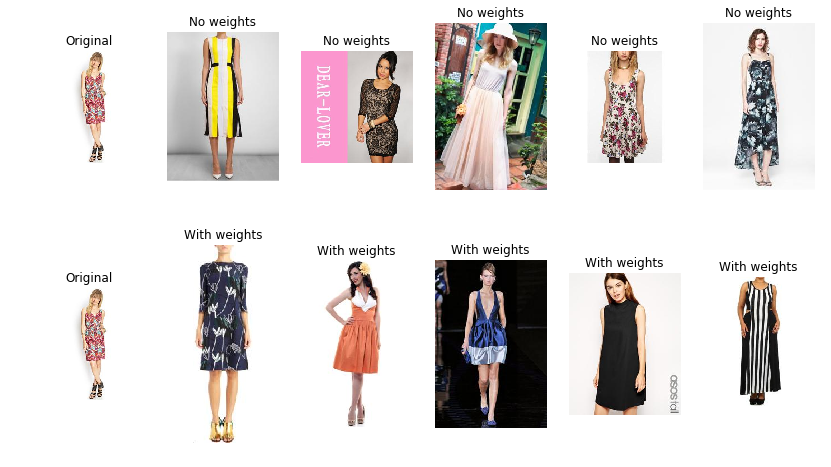

In [20]:
i = int(images[0])
compare_models(i, predicted1=predicted1, predicted2=predicted2, 
               tree1=tree1, tree2=tree2, label1='No weights', label2='With weights')

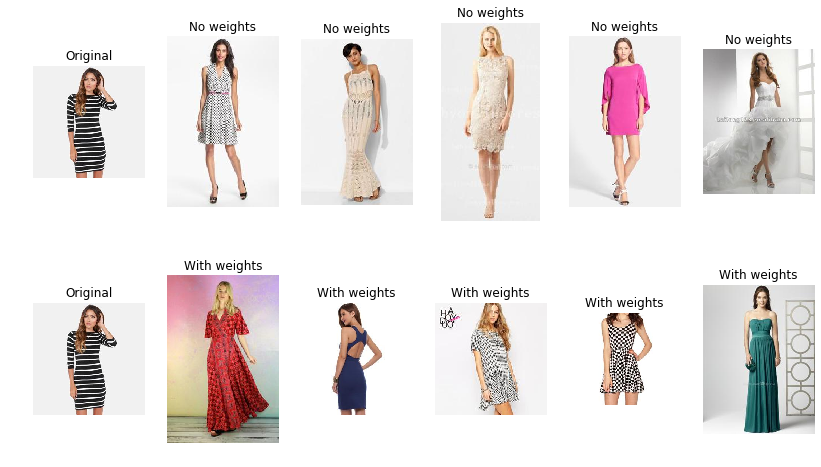

In [21]:
i = int(images[1])
compare_models(i, predicted1=predicted1, predicted2=predicted2, 
               tree1=tree1, tree2=tree2, label1='No weights', label2='With weights')

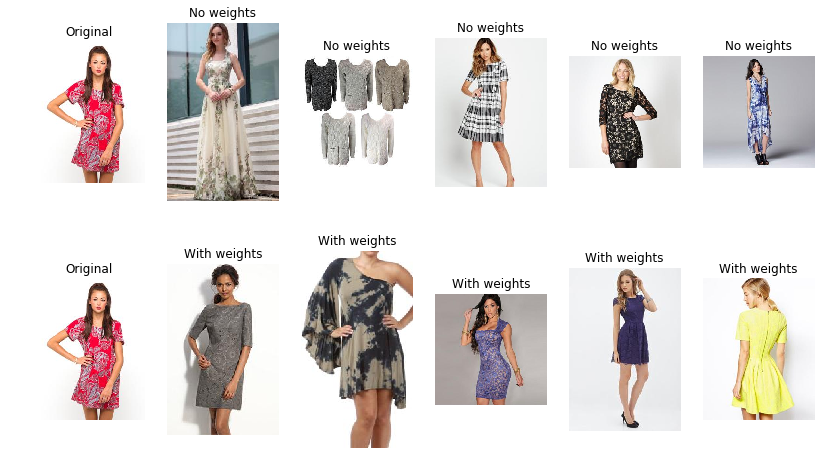

In [22]:
i = int(images[2])
compare_models(i, predicted1=predicted1, predicted2=predicted2, 
               tree1=tree1, tree2=tree2, label1='No weights', label2='With weights')

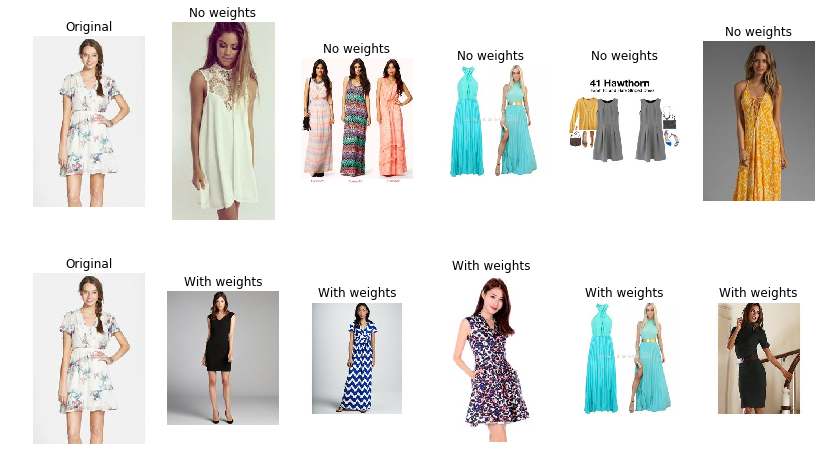

In [24]:
i = int(images[3])
compare_models(i, predicted1=predicted1, predicted2=predicted2, 
               tree1=tree1, tree2=tree2, label1='No weights', label2='With weights')

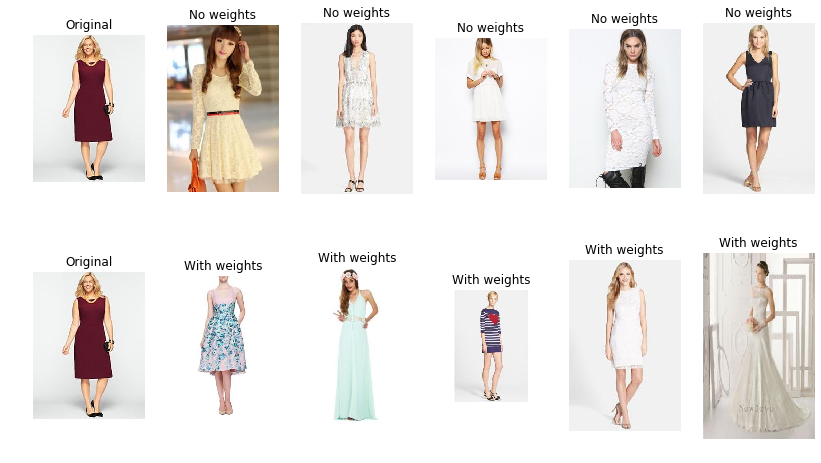

In [25]:
i = int(images[4])
compare_models(i, predicted1=predicted1, predicted2=predicted2, 
               tree1=tree1, tree2=tree2, label1='No weights', label2='With weights')

In [26]:
# update model comparison
mod1 = {'model':'model1 - 1 hidden layer - no weights', 'img0':3, 'img1':0, 'img2':3, 'img3':3, 'img4':1}
mod2 = {'model':'model2 - 1 hidden layer - with class weights', 'img0':2, 'img1':1, 'img2':3, 'img3':2, 'img4':1}
model_comparison = model_comparison.append([mod1,mod2])
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
0,model1 - 1 hidden layer - no weights,3,0,3,3,1
1,model2 - 1 hidden layer - with class weights,2,1,3,2,1


The results are not especially good for either model. There are some visual similarities in both cases, but there is definitely room for improvement. I will try now to build a deeper CNN with two hidden layers. I will not be training a model from scratch, but will rather do a transfer learning from my original model without class weights. I will remove two last layers (flatten and output) and will add another convolutional layer to it before the output. The layers from original model will be frozen during training and new layers will be trained.

In [27]:
# define a model
model3 = Sequential(model.layers[:-2])
model3.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model3.add(MaxPooling2D(2))
model3.add(Flatten())
model3.add(Dense(38, activation='sigmoid'))

# freeze layers from the first model
for layer in model3.layers[:-4]:
    layer.trainable = False

In [28]:
# compile model
model3.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [29]:
# train the model
start = timer()
history = model3.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#3 trained in ',timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 11s - loss: 0.6926 - accuracy: 0.518 - ETA: 8s - loss: 0.5548 - accuracy: 0.733 - ETA: 6s - loss: 0.4516 - accuracy: 0.80 - ETA: 5s - loss: 0.4080 - accuracy: 0.83 - ETA: 4s - loss: 0.3688 - accuracy: 0.85 - ETA: 3s - loss: 0.3564 - accuracy: 0.87 - ETA: 2s - loss: 0.3359 - accuracy: 0.88 - ETA: 1s - loss: 0.3236 - accuracy: 0.89 - ETA: 0s - loss: 0.3176 - accuracy: 0.89 - 12s 1s/step - loss: 0.3080 - accuracy: 0.9021 - val_loss: 0.1874 - val_accuracy: 0.9442
Epoch 2/20
10/10 [==============================] - ETA: 7s - loss: 0.2394 - accuracy: 0.93 - ETA: 7s - loss: 0.2232 - accuracy: 0.94 - ETA: 6s - loss: 0.2184 - accuracy: 0.94 - ETA: 5s - loss: 0.2182 - accuracy: 0.94 - ETA: 4s - loss: 0.2168 - accuracy: 0.94 - ETA: 3s - loss: 0.2164 - accuracy: 0.94 - ETA: 2s - loss: 0.2173 - accuracy: 0.94 - ETA: 1s - loss: 0.2140 - accuracy: 0.94 - ETA: 0s - loss: 0.2087 - accuracy: 0.94 - 13s 1s/step - loss: 0.2067 - accuracy: 0.9475 - v

10/10 [==============================] - ETA: 10s - loss: 0.2016 - accuracy: 0.943 - ETA: 8s - loss: 0.2032 - accuracy: 0.940 - ETA: 7s - loss: 0.2027 - accuracy: 0.94 - ETA: 6s - loss: 0.1951 - accuracy: 0.94 - ETA: 5s - loss: 0.1924 - accuracy: 0.94 - ETA: 4s - loss: 0.1900 - accuracy: 0.94 - ETA: 3s - loss: 0.1870 - accuracy: 0.94 - ETA: 2s - loss: 0.1904 - accuracy: 0.94 - ETA: 1s - loss: 0.1893 - accuracy: 0.94 - 14s 1s/step - loss: 0.1909 - accuracy: 0.9451 - val_loss: 0.1662 - val_accuracy: 0.9487
Epoch 17/20
10/10 [==============================] - ETA: 9s - loss: 0.1674 - accuracy: 0.95 - ETA: 8s - loss: 0.2043 - accuracy: 0.93 - ETA: 7s - loss: 0.1896 - accuracy: 0.94 - ETA: 6s - loss: 0.1830 - accuracy: 0.94 - ETA: 5s - loss: 0.1860 - accuracy: 0.94 - ETA: 4s - loss: 0.1891 - accuracy: 0.94 - ETA: 3s - loss: 0.1891 - accuracy: 0.94 - ETA: 2s - loss: 0.1900 - accuracy: 0.94 - ETA: 1s - loss: 0.1902 - accuracy: 0.94 - 14s 1s/step - loss: 0.1903 - accuracy: 0.9444 - val_loss: 0

In [30]:
predicted3 = model3.predict_generator(test_generator)

In [31]:
tree3 = BallTree(predicted3)

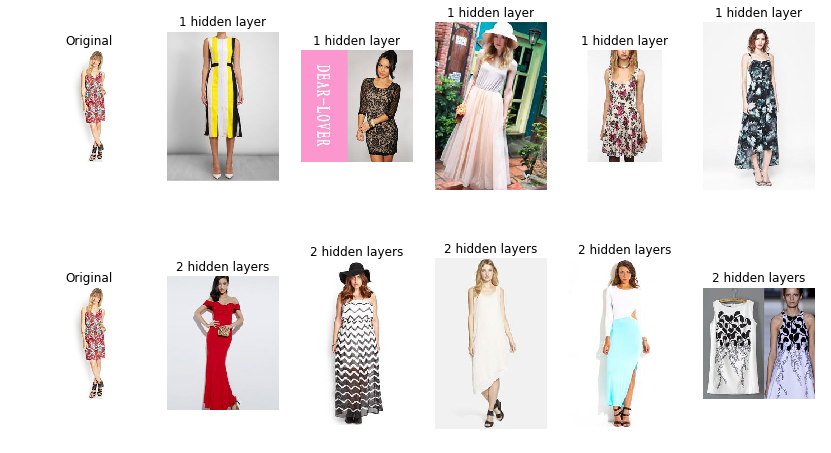

In [32]:
i = int(images[0])
compare_models(i, predicted1=predicted1, predicted2=predicted3, 
               tree1=tree1, tree2=tree3, label1='1 hidden layer', label2='2 hidden layers')

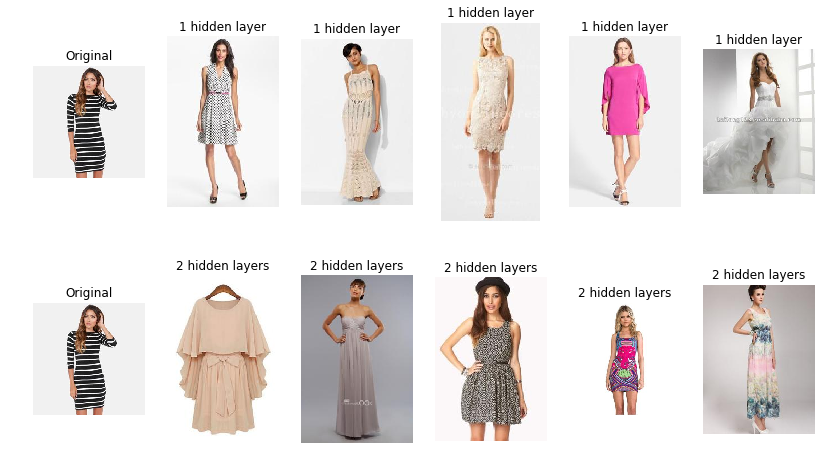

In [33]:
i = int(images[1])
compare_models(i, predicted1=predicted1, predicted2=predicted3, 
               tree1=tree1, tree2=tree3, label1='1 hidden layer', label2='2 hidden layers')

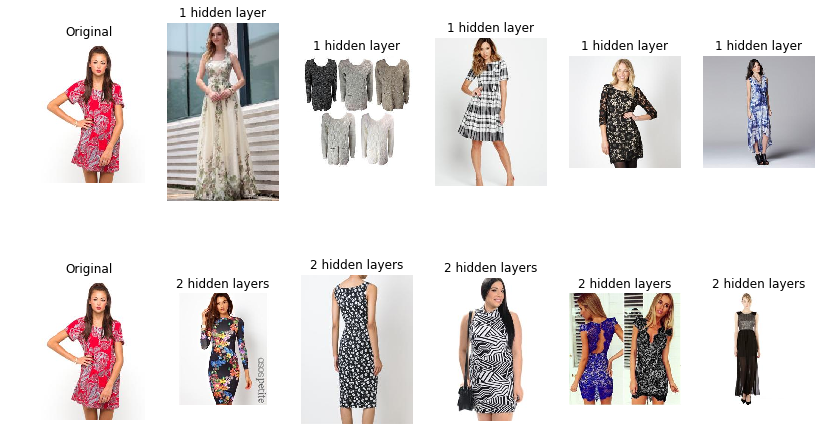

In [34]:
i = int(images[2])
compare_models(i, predicted1=predicted1, predicted2=predicted3, 
               tree1=tree1, tree2=tree3, label1='1 hidden layer', label2='2 hidden layers')

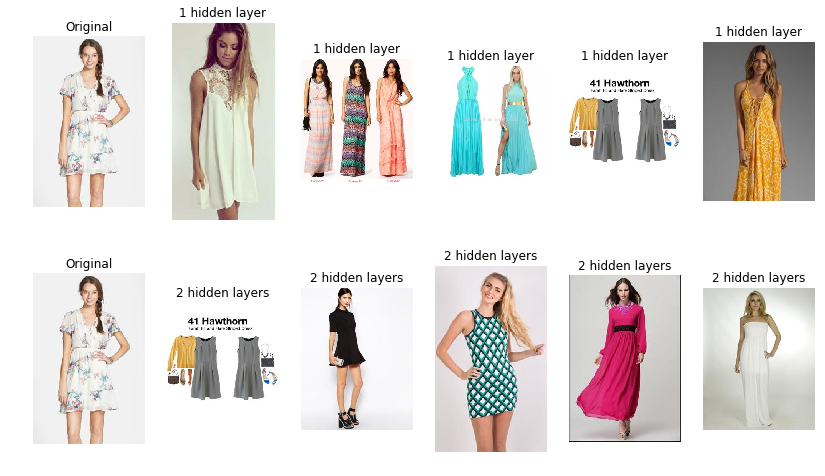

In [35]:
i = int(images[3])
compare_models(i, predicted1=predicted1, predicted2=predicted3, 
               tree1=tree1, tree2=tree3, label1='1 hidden layer', label2='2 hidden layers')

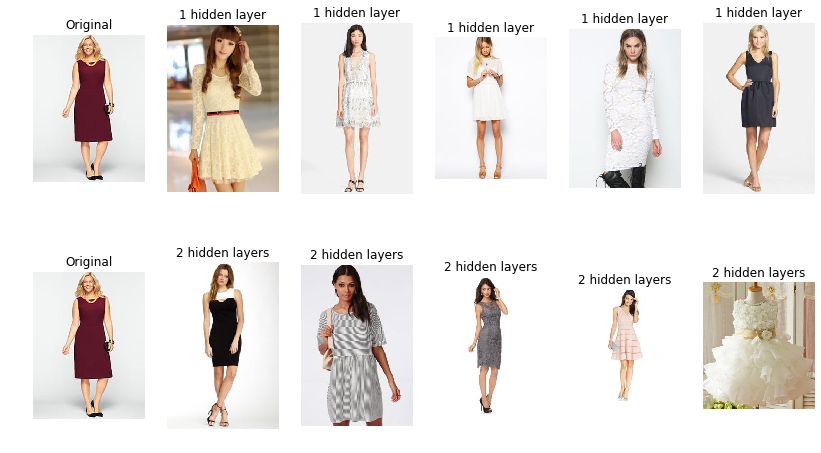

In [36]:
i = int(images[4])
compare_models(i, predicted1=predicted1, predicted2=predicted3, 
               tree1=tree1, tree2=tree3, label1='1 hidden layer', label2='2 hidden layers')

In [37]:
# update model_comparison dataframe
mod3 = {'model':'model3 - 2 hidden layers - no weights', 'img0':2, 'img1':1, 'img2':2, 'img3':3, 'img4':2}
model_comparison = model_comparison.append(mod3, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2


Adding one more hidden layer to test and performing transfer learning on previous model (model3).

In [38]:
# define a model
model4 = Sequential(model3.layers[:-2])
model4.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model4.add(MaxPooling2D(2))
model4.add(Flatten())
model4.add(Dense(38, activation='sigmoid'))

# freeze layers from the first model
for layer in model4.layers[:-4]:
    layer.trainable = False

In [39]:
# compile model
model4.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [40]:
# train the model
start = timer()
history = model4.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#4 trained in ', timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 9s - loss: 0.6927 - accuracy: 0.53 - ETA: 6s - loss: 0.6719 - accuracy: 0.73 - ETA: 5s - loss: 0.6319 - accuracy: 0.80 - ETA: 4s - loss: 0.5800 - accuracy: 0.84 - ETA: 3s - loss: 0.5255 - accuracy: 0.86 - ETA: 2s - loss: 0.4761 - accuracy: 0.87 - ETA: 2s - loss: 0.4357 - accuracy: 0.88 - ETA: 1s - loss: 0.4123 - accuracy: 0.89 - ETA: 0s - loss: 0.3972 - accuracy: 0.89 - 10s 978ms/step - loss: 0.3847 - accuracy: 0.9031 - val_loss: 0.2284 - val_accuracy: 0.9442
Epoch 2/20
10/10 [==============================] - ETA: 6s - loss: 0.2709 - accuracy: 0.93 - ETA: 5s - loss: 0.2860 - accuracy: 0.93 - ETA: 4s - loss: 0.2648 - accuracy: 0.94 - ETA: 4s - loss: 0.2611 - accuracy: 0.94 - ETA: 3s - loss: 0.2570 - accuracy: 0.94 - ETA: 2s - loss: 0.2530 - accuracy: 0.94 - ETA: 2s - loss: 0.2449 - accuracy: 0.94 - ETA: 1s - loss: 0.2417 - accuracy: 0.94 - ETA: 0s - loss: 0.2402 - accuracy: 0.94 - 10s 1s/step - loss: 0.2384 - accuracy: 0.9420 - v

10/10 [==============================] - ETA: 7s - loss: 0.1919 - accuracy: 0.94 - ETA: 6s - loss: 0.1945 - accuracy: 0.94 - ETA: 5s - loss: 0.1922 - accuracy: 0.94 - ETA: 5s - loss: 0.1915 - accuracy: 0.94 - ETA: 4s - loss: 0.1872 - accuracy: 0.94 - ETA: 3s - loss: 0.1898 - accuracy: 0.94 - ETA: 2s - loss: 0.1863 - accuracy: 0.94 - ETA: 1s - loss: 0.1902 - accuracy: 0.94 - ETA: 0s - loss: 0.1902 - accuracy: 0.94 - 12s 1s/step - loss: 0.1911 - accuracy: 0.9446 - val_loss: 0.1696 - val_accuracy: 0.9487
Epoch 17/20
10/10 [==============================] - ETA: 7s - loss: 0.1962 - accuracy: 0.94 - ETA: 6s - loss: 0.1879 - accuracy: 0.94 - ETA: 5s - loss: 0.1969 - accuracy: 0.94 - ETA: 4s - loss: 0.1917 - accuracy: 0.94 - ETA: 4s - loss: 0.1957 - accuracy: 0.94 - ETA: 3s - loss: 0.1972 - accuracy: 0.94 - ETA: 2s - loss: 0.1979 - accuracy: 0.94 - ETA: 1s - loss: 0.1986 - accuracy: 0.94 - ETA: 0s - loss: 0.1975 - accuracy: 0.94 - 12s 1s/step - loss: 0.1983 - accuracy: 0.9429 - val_loss: 0.21

In [41]:
predicted4 = model4.predict_generator(test_generator)

In [42]:
tree4 = BallTree(predicted4)

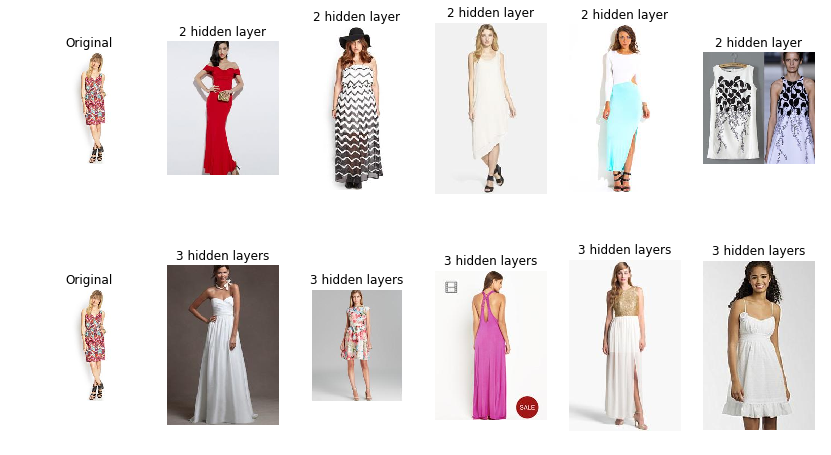

In [43]:
i = int(images[0])
compare_models(i, predicted1=predicted3, predicted2=predicted4, 
               tree1=tree3, tree2=tree4, label1='2 hidden layer', label2='3 hidden layers')

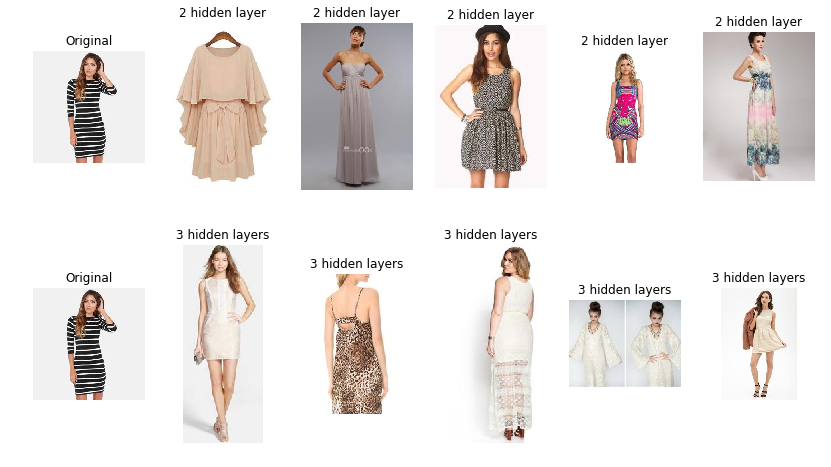

In [44]:
i = int(images[1])
compare_models(i, predicted1=predicted3, predicted2=predicted4, 
               tree1=tree3, tree2=tree4, label1='2 hidden layer', label2='3 hidden layers')

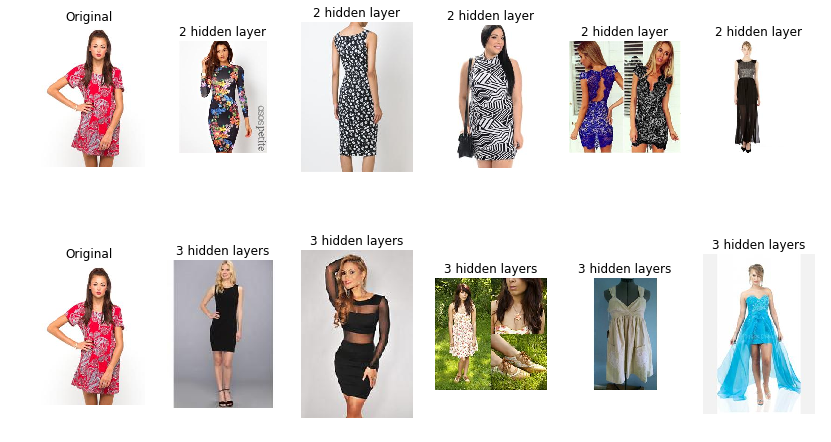

In [45]:
i = int(images[2])
compare_models(i, predicted1=predicted3, predicted2=predicted4, 
               tree1=tree3, tree2=tree4, label1='2 hidden layer', label2='3 hidden layers')

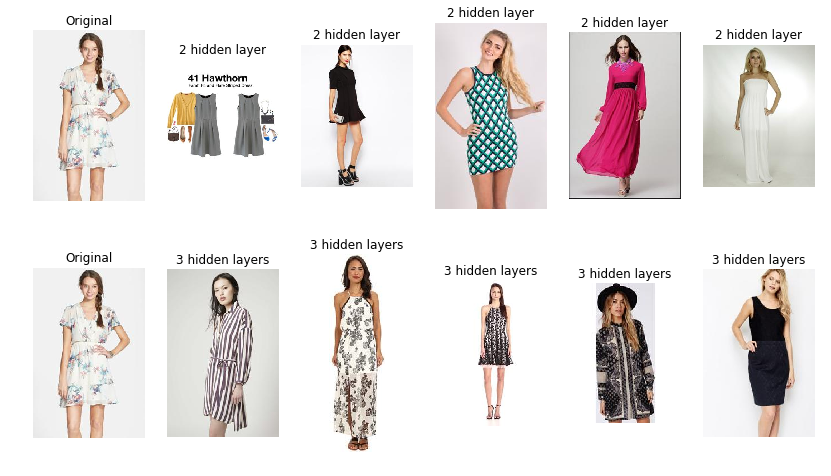

In [46]:
i = int(images[3])
compare_models(i, predicted1=predicted3, predicted2=predicted4, 
               tree1=tree3, tree2=tree4, label1='2 hidden layer', label2='3 hidden layers')

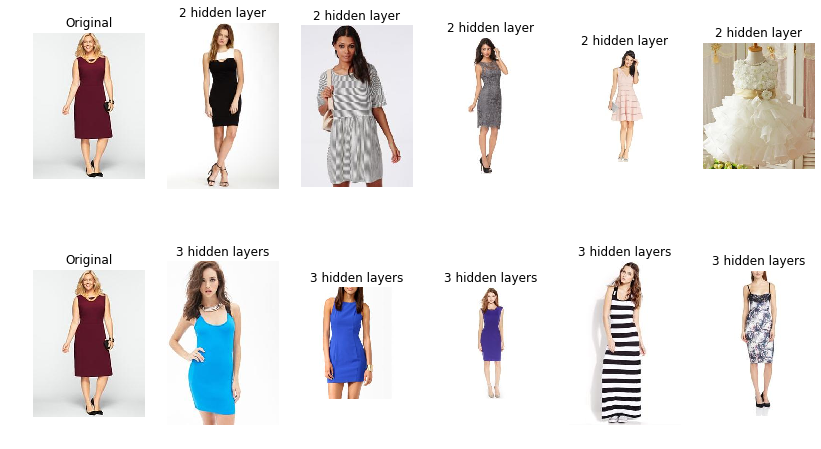

In [47]:
i = int(images[4])
compare_models(i, predicted1=predicted3, predicted2=predicted4, 
               tree1=tree3, tree2=tree4, label1='2 hidden layer', label2='3 hidden layers')

In [48]:
# update model_comparison dataframe
mod4 = {'model':'model4 - 3 hidden layers - no weights', 'img0':2, 'img1':2, 'img2':2, 'img3':3, 'img4':2}
model_comparison = model_comparison.append(mod4, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2


Adding one more layer and reusing previous model.

In [49]:
# define a model
model5 = Sequential(model4.layers[:-2])
model5.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model5.add(MaxPooling2D(2))
model5.add(Flatten())
model5.add(Dense(38, activation='sigmoid'))

# freeze layers from the first model
for layer in model5.layers[:-4]:
    layer.trainable = False

In [50]:
# compile model
model5.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [52]:
# train the model
start = timer()
history = model5.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#5 trained in ', timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 8s - loss: 0.2066 - accuracy: 0.94 - ETA: 6s - loss: 0.2027 - accuracy: 0.94 - ETA: 5s - loss: 0.2132 - accuracy: 0.94 - ETA: 4s - loss: 0.2100 - accuracy: 0.94 - ETA: 4s - loss: 0.2081 - accuracy: 0.94 - ETA: 3s - loss: 0.2082 - accuracy: 0.94 - ETA: 2s - loss: 0.2061 - accuracy: 0.94 - ETA: 1s - loss: 0.2037 - accuracy: 0.94 - ETA: 0s - loss: 0.2027 - accuracy: 0.94 - 13s 1s/step - loss: 0.2027 - accuracy: 0.9451 - val_loss: 0.1904 - val_accuracy: 0.9442
Epoch 2/20
10/10 [==============================] - ETA: 6s - loss: 0.1971 - accuracy: 0.94 - ETA: 6s - loss: 0.2067 - accuracy: 0.94 - ETA: 5s - loss: 0.2101 - accuracy: 0.94 - ETA: 4s - loss: 0.2044 - accuracy: 0.94 - ETA: 3s - loss: 0.1983 - accuracy: 0.94 - ETA: 3s - loss: 0.2003 - accuracy: 0.94 - ETA: 2s - loss: 0.1992 - accuracy: 0.94 - ETA: 1s - loss: 0.1971 - accuracy: 0.94 - ETA: 0s - loss: 0.1968 - accuracy: 0.94 - 11s 1s/step - loss: 0.1996 - accuracy: 0.9444 - val_

10/10 [==============================] - ETA: 7s - loss: 0.1717 - accuracy: 0.94 - ETA: 6s - loss: 0.1814 - accuracy: 0.94 - ETA: 5s - loss: 0.1751 - accuracy: 0.94 - ETA: 4s - loss: 0.1795 - accuracy: 0.94 - ETA: 3s - loss: 0.1833 - accuracy: 0.94 - ETA: 3s - loss: 0.1878 - accuracy: 0.94 - ETA: 2s - loss: 0.1893 - accuracy: 0.94 - ETA: 1s - loss: 0.1897 - accuracy: 0.94 - ETA: 0s - loss: 0.1905 - accuracy: 0.94 - 11s 1s/step - loss: 0.1916 - accuracy: 0.9447 - val_loss: 0.1663 - val_accuracy: 0.9487
Epoch 17/20
10/10 [==============================] - ETA: 7s - loss: 0.1913 - accuracy: 0.94 - ETA: 6s - loss: 0.1875 - accuracy: 0.94 - ETA: 5s - loss: 0.1851 - accuracy: 0.94 - ETA: 4s - loss: 0.1857 - accuracy: 0.94 - ETA: 3s - loss: 0.1870 - accuracy: 0.94 - ETA: 3s - loss: 0.1880 - accuracy: 0.94 - ETA: 2s - loss: 0.1887 - accuracy: 0.94 - ETA: 1s - loss: 0.1894 - accuracy: 0.94 - ETA: 0s - loss: 0.1882 - accuracy: 0.94 - 11s 1s/step - loss: 0.1884 - accuracy: 0.9455 - val_loss: 0.21

In [53]:
predicted5 = model5.predict_generator(test_generator)

In [54]:
tree5 = BallTree(predicted5)

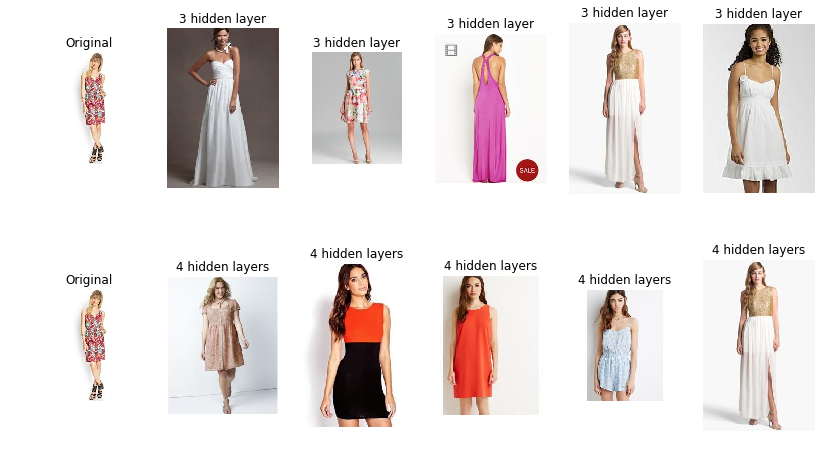

In [55]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted5, 
               tree1=tree4, tree2=tree5, label1='3 hidden layer', label2='4 hidden layers')

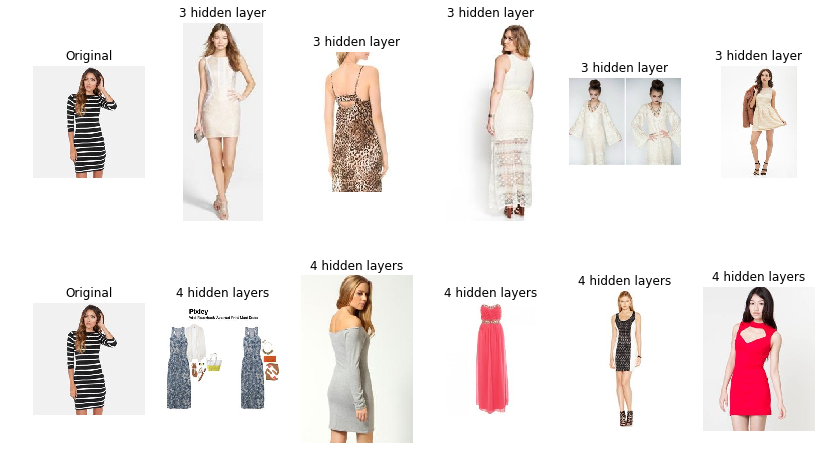

In [56]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted5, 
               tree1=tree4, tree2=tree5, label1='3 hidden layer', label2='4 hidden layers')

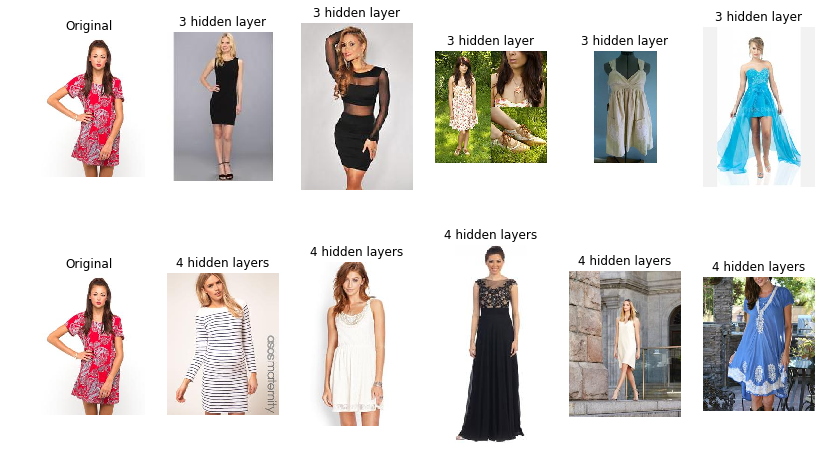

In [57]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted5, 
               tree1=tree4, tree2=tree5, label1='3 hidden layer', label2='4 hidden layers')

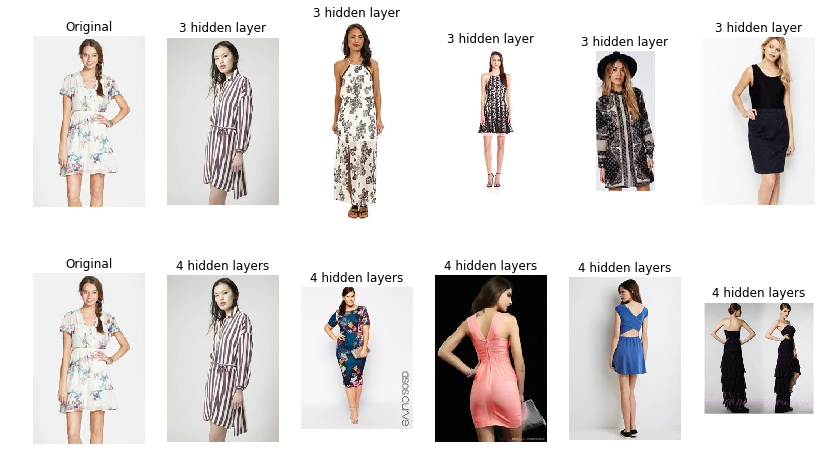

In [58]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted5, 
               tree1=tree4, tree2=tree5, label1='3 hidden layer', label2='4 hidden layers')

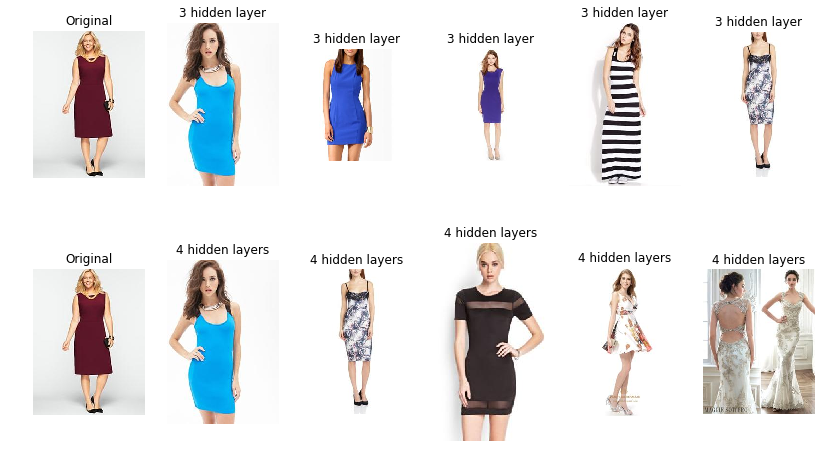

In [59]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted5, 
               tree1=tree4, tree2=tree5, label1='3 hidden layer', label2='4 hidden layers')

In [60]:
# update model_comparison dataframe
mod5 = {'model':'model5 - 4 hidden layers - no weights', 'img0':3, 'img1':2, 'img2':2, 'img3':1, 'img4':1}
model_comparison = model_comparison.append(mod5, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1


The CNN with 3 hidden layers slightly "outperformed" others. I will play around with some other parameters like number of neurons on each layer, kernel size and activation functions to see if better results can be obtained.

In [61]:
# define a model and change number of neurons to 256 for hidden layers
model6 = Sequential()
n_row = 300
n_col = 200
n_output = len(attr_columns)
model6.add(Conv2D(10, kernel_size=3, activation='relu', padding = 'same', input_shape=[n_row,n_col,3]))
model6.add(BatchNormalization())
model6.add(MaxPooling2D(2))
model6.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(2))
model6.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(2))
model6.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(2))
model6.add(Flatten())
model6.add(Dense(38, activation='sigmoid'))

In [62]:
# compile model
model6.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [63]:
# train the model
start = timer()
history = model6.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model #6 trained in ',timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 37s - loss: 0.7129 - accuracy: 0.410 - ETA: 31s - loss: 0.5386 - accuracy: 0.676 - ETA: 29s - loss: 0.4392 - accuracy: 0.765 - ETA: 27s - loss: 0.3941 - accuracy: 0.809 - ETA: 25s - loss: 0.3586 - accuracy: 0.836 - ETA: 20s - loss: 0.3453 - accuracy: 0.853 - ETA: 14s - loss: 0.3276 - accuracy: 0.866 - ETA: 9s - loss: 0.3140 - accuracy: 0.875 - ETA: 4s - loss: 0.3049 - accuracy: 0.88 - 56s 6s/step - loss: 0.2958 - accuracy: 0.8906 - val_loss: 0.2235 - val_accuracy: 0.9442
Epoch 2/20
10/10 [==============================] - ETA: 42s - loss: 0.1829 - accuracy: 0.947 - ETA: 37s - loss: 0.1943 - accuracy: 0.947 - ETA: 32s - loss: 0.2052 - accuracy: 0.944 - ETA: 28s - loss: 0.2085 - accuracy: 0.944 - ETA: 23s - loss: 0.2123 - accuracy: 0.943 - ETA: 18s - loss: 0.2096 - accuracy: 0.944 - ETA: 14s - loss: 0.2126 - accuracy: 0.943 - ETA: 9s - loss: 0.2129 - accuracy: 0.942 - ETA: 4s - loss: 0.2151 - accuracy: 0.94 - 54s 5s/step - loss: 0.

10/10 [==============================] - ETA: 42s - loss: 0.1918 - accuracy: 0.944 - ETA: 38s - loss: 0.1791 - accuracy: 0.949 - ETA: 33s - loss: 0.1868 - accuracy: 0.947 - ETA: 28s - loss: 0.1871 - accuracy: 0.947 - ETA: 23s - loss: 0.1867 - accuracy: 0.947 - ETA: 19s - loss: 0.1886 - accuracy: 0.946 - ETA: 14s - loss: 0.1874 - accuracy: 0.946 - ETA: 9s - loss: 0.1881 - accuracy: 0.945 - ETA: 4s - loss: 0.1892 - accuracy: 0.94 - 55s 6s/step - loss: 0.1880 - accuracy: 0.9460 - val_loss: 0.2241 - val_accuracy: 0.9492
Epoch 17/20
10/10 [==============================] - ETA: 42s - loss: 0.1921 - accuracy: 0.949 - ETA: 38s - loss: 0.1932 - accuracy: 0.947 - ETA: 33s - loss: 0.1951 - accuracy: 0.946 - ETA: 28s - loss: 0.1877 - accuracy: 0.949 - ETA: 23s - loss: 0.1894 - accuracy: 0.947 - ETA: 19s - loss: 0.1889 - accuracy: 0.946 - ETA: 14s - loss: 0.1885 - accuracy: 0.946 - ETA: 9s - loss: 0.1892 - accuracy: 0.946 - ETA: 4s - loss: 0.1888 - accuracy: 0.94 - 55s 6s/step - loss: 0.1897 - acc

In [64]:
predicted6 = model6.predict_generator(test_generator)

In [65]:
tree6 = BallTree(predicted6)

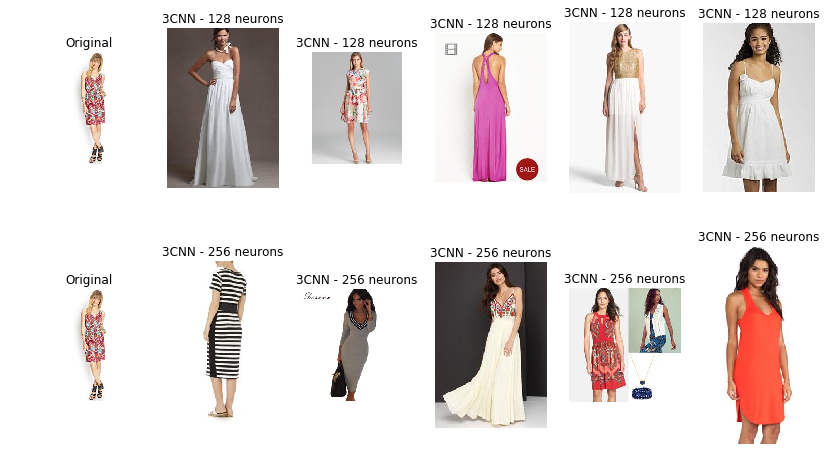

In [66]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted6, 
               tree1=tree4, tree2=tree6, label1='3CNN - 128 neurons', label2='3CNN - 256 neurons')

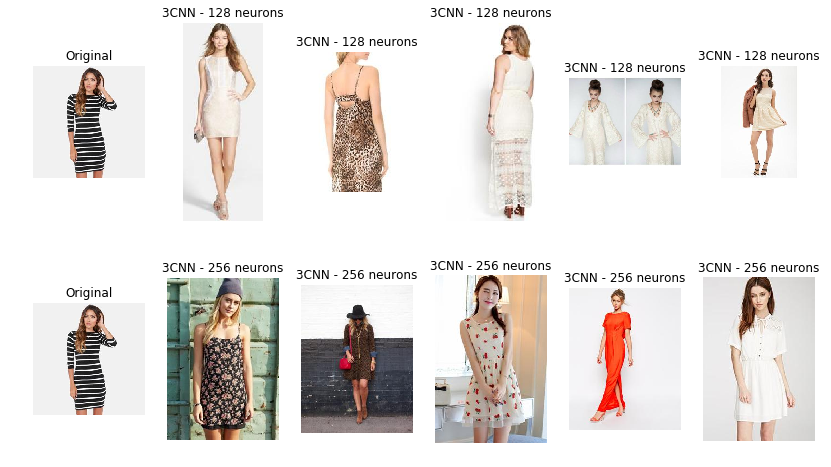

In [67]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted6, 
               tree1=tree4, tree2=tree6, label1='3CNN - 128 neurons', label2='3CNN - 256 neurons')

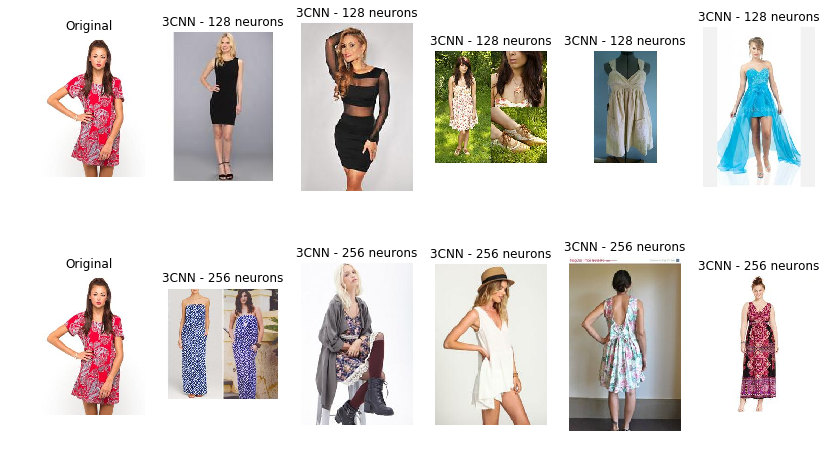

In [68]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted6, 
               tree1=tree4, tree2=tree6, label1='3CNN - 128 neurons', label2='3CNN - 256 neurons')

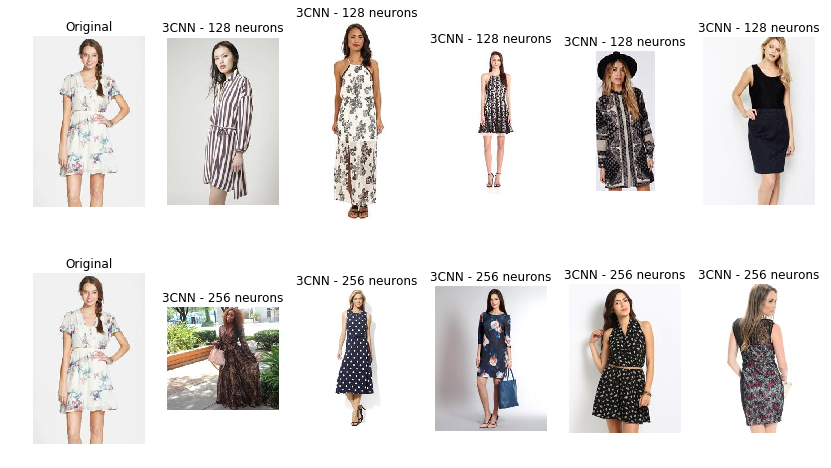

In [69]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted6, 
               tree1=tree4, tree2=tree6, label1='3CNN - 128 neurons', label2='3CNN - 256 neurons')

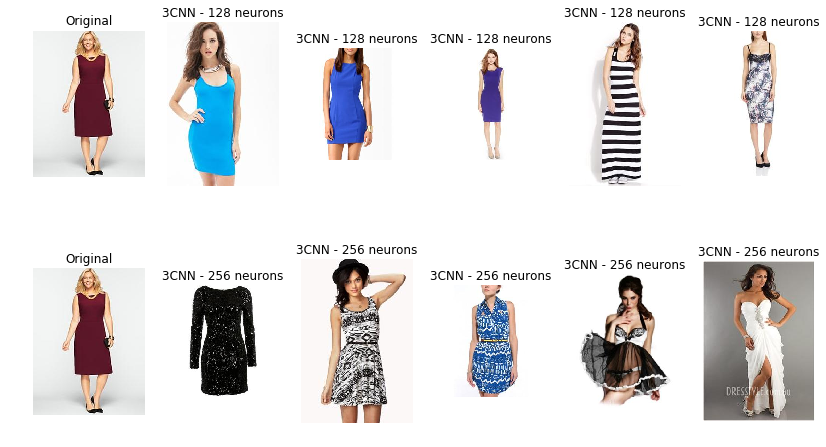

In [70]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted6, 
               tree1=tree4, tree2=tree6, label1='3CNN - 128 neurons', label2='3CNN - 256 neurons')

In [71]:
# update model_comparison dataframe
mod6 = {'model':'model6 - 3 hidden layers - 256 neurons/layer', 'img0':2, 'img1':1, 'img2':2, 'img3':2, 'img4':1}
model_comparison = model_comparison.append(mod6, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1
6,model6 - 3 hidden layers - 256 neurons/layer,2,1,2,2,1


In [72]:
# define a model and change kernel size to 5x5
model7 = Sequential()
n_row = 300
n_col = 200
n_output = len(attr_columns)
model7.add(Conv2D(10, kernel_size=5, activation='relu', padding = 'same', input_shape=[n_row,n_col,3]))
model7.add(BatchNormalization())
model7.add(MaxPooling2D(2))
model7.add(Conv2D(128, kernel_size=5, activation='relu', padding='same'))
model7.add(MaxPooling2D(2))
model7.add(Conv2D(128, kernel_size=5, activation='relu', padding='same'))
model7.add(MaxPooling2D(2))
model7.add(Conv2D(128, kernel_size=5, activation='relu', padding='same'))
model7.add(MaxPooling2D(2))
model7.add(Flatten())
model7.add(Dense(38, activation='sigmoid'))

In [73]:
# compile model
model7.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [74]:
# train the model
start = timer()
history = model7.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#7 trained in ',timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 34s - loss: 0.6902 - accuracy: 0.529 - ETA: 28s - loss: 0.5961 - accuracy: 0.737 - ETA: 23s - loss: 0.4668 - accuracy: 0.807 - ETA: 20s - loss: 0.4268 - accuracy: 0.837 - ETA: 18s - loss: 0.3940 - accuracy: 0.852 - ETA: 15s - loss: 0.3709 - accuracy: 0.863 - ETA: 11s - loss: 0.3540 - accuracy: 0.874 - ETA: 7s - loss: 0.3341 - accuracy: 0.883 - ETA: 3s - loss: 0.3207 - accuracy: 0.88 - 46s 5s/step - loss: 0.3117 - accuracy: 0.8952 - val_loss: 0.2031 - val_accuracy: 0.9442
Epoch 2/20
10/10 [==============================] - ETA: 38s - loss: 0.2154 - accuracy: 0.945 - ETA: 34s - loss: 0.2138 - accuracy: 0.943 - ETA: 30s - loss: 0.2085 - accuracy: 0.945 - ETA: 25s - loss: 0.2168 - accuracy: 0.943 - ETA: 21s - loss: 0.2189 - accuracy: 0.942 - ETA: 17s - loss: 0.2179 - accuracy: 0.942 - ETA: 12s - loss: 0.2189 - accuracy: 0.942 - ETA: 8s - loss: 0.2144 - accuracy: 0.943 - ETA: 4s - loss: 0.2156 - accuracy: 0.94 - 50s 5s/step - loss: 0.

10/10 [==============================] - ETA: 41s - loss: 0.1845 - accuracy: 0.944 - ETA: 36s - loss: 0.1831 - accuracy: 0.947 - ETA: 32s - loss: 0.1881 - accuracy: 0.945 - ETA: 27s - loss: 0.1898 - accuracy: 0.945 - ETA: 23s - loss: 0.1981 - accuracy: 0.943 - ETA: 18s - loss: 0.1942 - accuracy: 0.944 - ETA: 13s - loss: 0.1940 - accuracy: 0.944 - ETA: 9s - loss: 0.1944 - accuracy: 0.944 - ETA: 4s - loss: 0.1947 - accuracy: 0.94 - 54s 5s/step - loss: 0.1930 - accuracy: 0.9445 - val_loss: 0.2564 - val_accuracy: 0.9492
Epoch 17/20
10/10 [==============================] - ETA: 42s - loss: 0.1857 - accuracy: 0.945 - ETA: 37s - loss: 0.1937 - accuracy: 0.945 - ETA: 32s - loss: 0.1890 - accuracy: 0.946 - ETA: 27s - loss: 0.1886 - accuracy: 0.946 - ETA: 23s - loss: 0.1896 - accuracy: 0.945 - ETA: 18s - loss: 0.1914 - accuracy: 0.945 - ETA: 13s - loss: 0.1927 - accuracy: 0.944 - ETA: 9s - loss: 0.1927 - accuracy: 0.944 - ETA: 4s - loss: 0.1924 - accuracy: 0.94 - 53s 5s/step - loss: 0.1935 - acc

In [75]:
predicted7 = model7.predict_generator(test_generator)

In [76]:
tree7 = BallTree(predicted7)

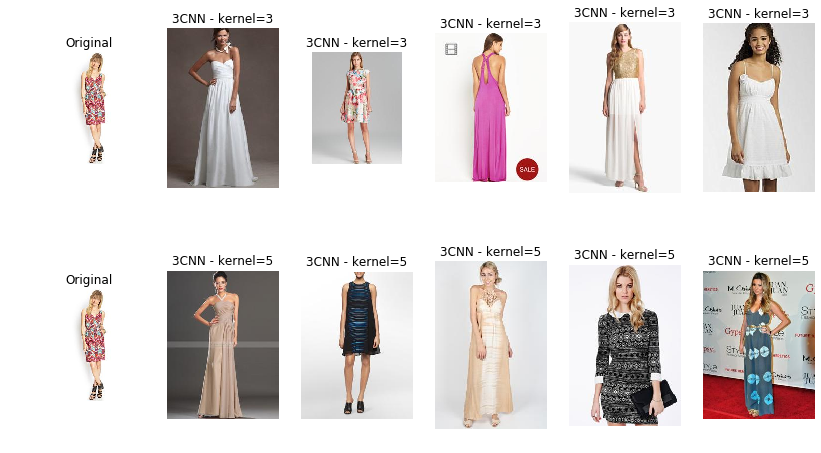

In [77]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted7, 
               tree1=tree4, tree2=tree7, label1='3CNN - kernel=3', label2='3CNN - kernel=5')

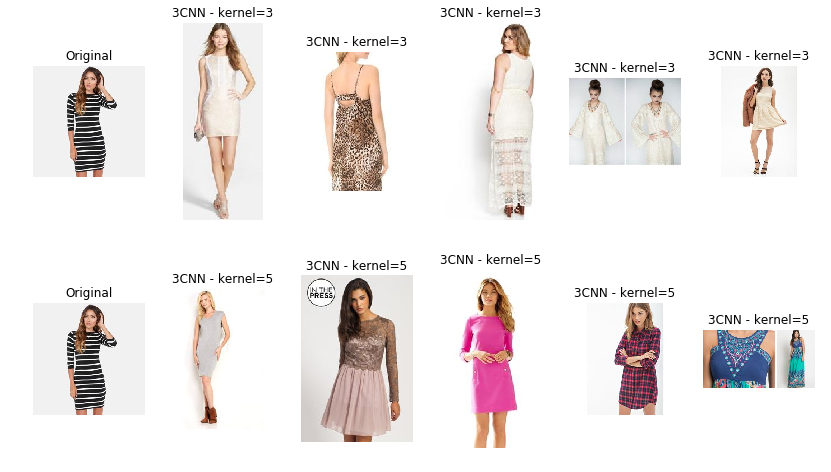

In [78]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted7, 
               tree1=tree4, tree2=tree7, label1='3CNN - kernel=3', label2='3CNN - kernel=5')

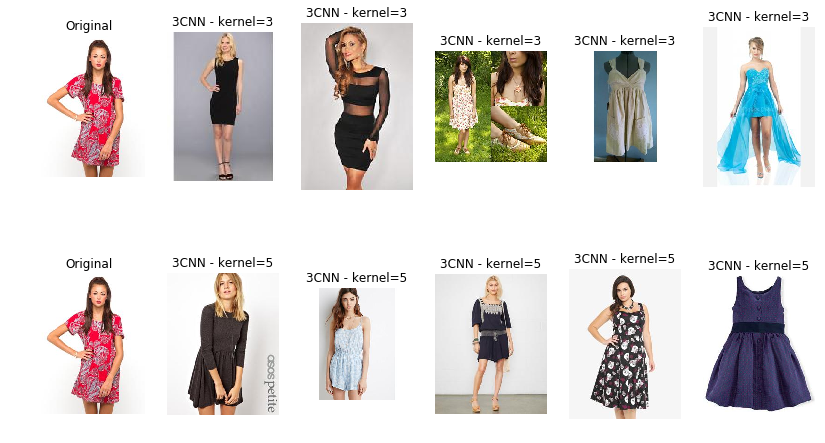

In [79]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted7, 
               tree1=tree4, tree2=tree7, label1='3CNN - kernel=3', label2='3CNN - kernel=5')

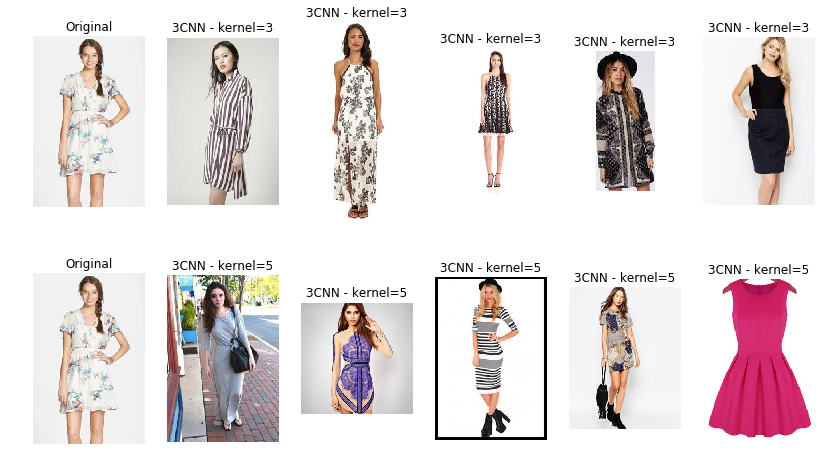

In [80]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted7, 
               tree1=tree4, tree2=tree7, label1='3CNN - kernel=3', label2='3CNN - kernel=5')

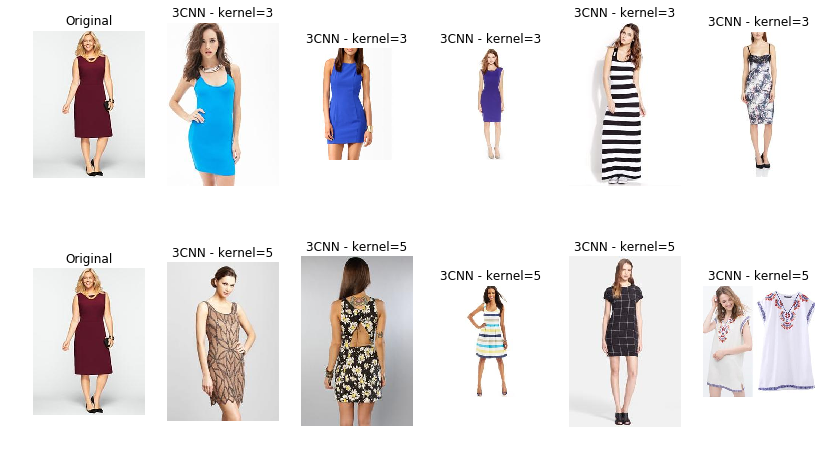

In [81]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted7, 
               tree1=tree4, tree2=tree7, label1='3CNN - kernel=3', label2='3CNN - kernel=5')

In [82]:
# update model_comparison dataframe
mod7 = {'model':'model7 - 3 hidden layers - 5x5 kernel', 'img0':1, 'img1':2, 'img2':4, 'img3':1, 'img4':1}
model_comparison = model_comparison.append(mod7, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1
6,model6 - 3 hidden layers - 256 neurons/layer,2,1,2,2,1
7,model7 - 3 hidden layers - 5x5 kernel,1,2,4,1,1


In [83]:
# define a model and change activation function to leaky ReLU
model8 = Sequential()
n_row = 300
n_col = 200
n_output = len(attr_columns)
model8.add(Conv2D(10, kernel_size=5, padding = 'same', input_shape=[n_row,n_col,3]))
model8.add(keras.layers.LeakyReLU(alpha=0.2))
model8.add(BatchNormalization())
model8.add(MaxPooling2D(2))
model8.add(Conv2D(128, kernel_size=5, padding='same'))
model8.add(keras.layers.LeakyReLU(alpha=0.2))
model8.add(MaxPooling2D(2))
model8.add(Conv2D(128, kernel_size=5, padding='same'))
model8.add(keras.layers.LeakyReLU(alpha=0.2))
model8.add(MaxPooling2D(2))
model8.add(Conv2D(128, kernel_size=5, padding='same'))
model8.add(keras.layers.LeakyReLU(alpha=0.2))
model8.add(MaxPooling2D(2))
model8.add(Flatten())
model8.add(Dense(38, activation='sigmoid'))

In [84]:
# compile model
model8.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [85]:
# train the model
start = timer()
history = model8.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#8 trained in ',timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 36s - loss: 0.7005 - accuracy: 0.508 - ETA: 31s - loss: 0.5361 - accuracy: 0.726 - ETA: 28s - loss: 0.8747 - accuracy: 0.510 - ETA: 28s - loss: 0.7276 - accuracy: 0.618 - ETA: 24s - loss: 0.6562 - accuracy: 0.683 - ETA: 19s - loss: 0.5919 - accuracy: 0.723 - ETA: 14s - loss: 0.5645 - accuracy: 0.735 - ETA: 9s - loss: 0.5393 - accuracy: 0.761 - ETA: 4s - loss: 0.5378 - accuracy: 0.78 - 53s 5s/step - loss: 0.5338 - accuracy: 0.7962 - val_loss: 0.7615 - val_accuracy: 0.5327
Epoch 2/20
10/10 [==============================] - ETA: 39s - loss: 0.3317 - accuracy: 0.870 - ETA: 35s - loss: 0.2962 - accuracy: 0.905 - ETA: 30s - loss: 0.2965 - accuracy: 0.916 - ETA: 26s - loss: 0.2866 - accuracy: 0.920 - ETA: 22s - loss: 0.2884 - accuracy: 0.921 - ETA: 17s - loss: 0.2834 - accuracy: 0.918 - ETA: 13s - loss: 0.2828 - accuracy: 0.921 - ETA: 8s - loss: 0.2851 - accuracy: 0.920 - ETA: 4s - loss: 0.3097 - accuracy: 0.92 - 51s 5s/step - loss: 0.

10/10 [==============================] - ETA: 43s - loss: 0.2050 - accuracy: 0.945 - ETA: 38s - loss: 0.1930 - accuracy: 0.948 - ETA: 33s - loss: 0.1911 - accuracy: 0.947 - ETA: 28s - loss: 0.1968 - accuracy: 0.945 - ETA: 24s - loss: 0.1926 - accuracy: 0.946 - ETA: 19s - loss: 0.1922 - accuracy: 0.946 - ETA: 14s - loss: 0.1918 - accuracy: 0.947 - ETA: 9s - loss: 0.1904 - accuracy: 0.947 - ETA: 4s - loss: 0.1915 - accuracy: 0.94 - 55s 6s/step - loss: 0.1934 - accuracy: 0.9461 - val_loss: 0.3432 - val_accuracy: 0.9462
Epoch 17/20
10/10 [==============================] - ETA: 42s - loss: 0.1966 - accuracy: 0.944 - ETA: 37s - loss: 0.1993 - accuracy: 0.942 - ETA: 33s - loss: 0.2051 - accuracy: 0.940 - ETA: 28s - loss: 0.2055 - accuracy: 0.941 - ETA: 23s - loss: 0.2030 - accuracy: 0.941 - ETA: 18s - loss: 0.2017 - accuracy: 0.941 - ETA: 14s - loss: 0.1999 - accuracy: 0.942 - ETA: 9s - loss: 0.1966 - accuracy: 0.943 - ETA: 4s - loss: 0.1985 - accuracy: 0.94 - 55s 5s/step - loss: 0.1991 - acc

In [86]:
predicted8 = model8.predict_generator(test_generator)

In [87]:
tree8 = BallTree(predicted8)

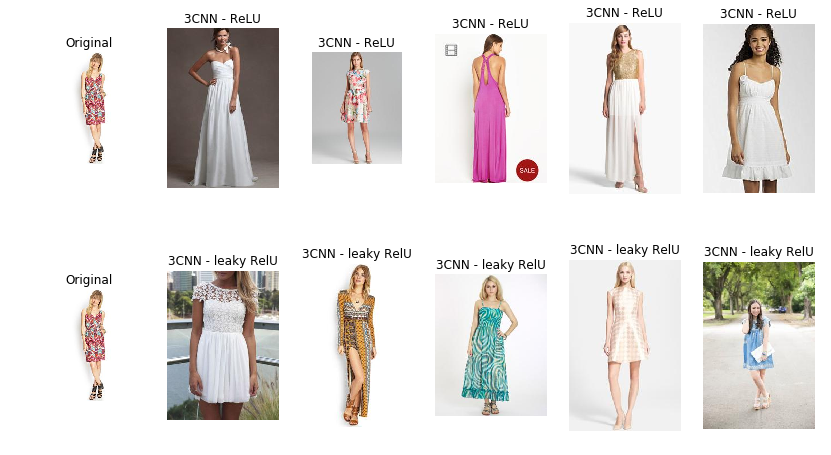

In [88]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted8, 
               tree1=tree4, tree2=tree8, label1='3CNN - ReLU', label2='3CNN - leaky RelU')

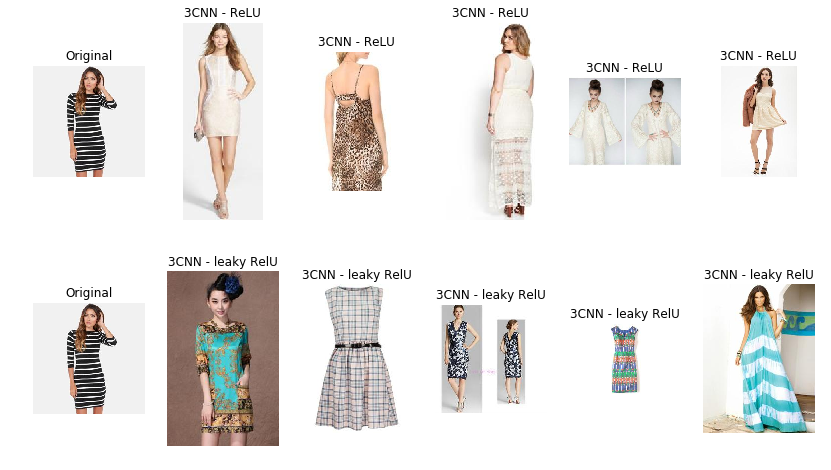

In [89]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted8, 
               tree1=tree4, tree2=tree8, label1='3CNN - ReLU', label2='3CNN - leaky RelU')

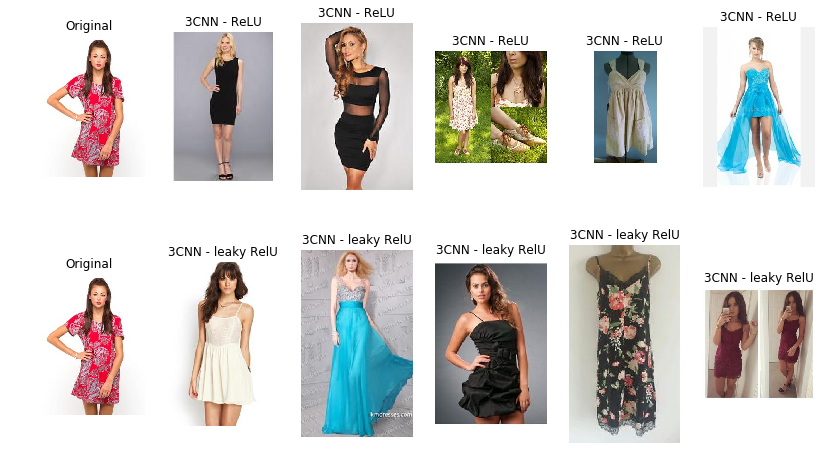

In [90]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted8, 
               tree1=tree4, tree2=tree8, label1='3CNN - ReLU', label2='3CNN - leaky RelU')

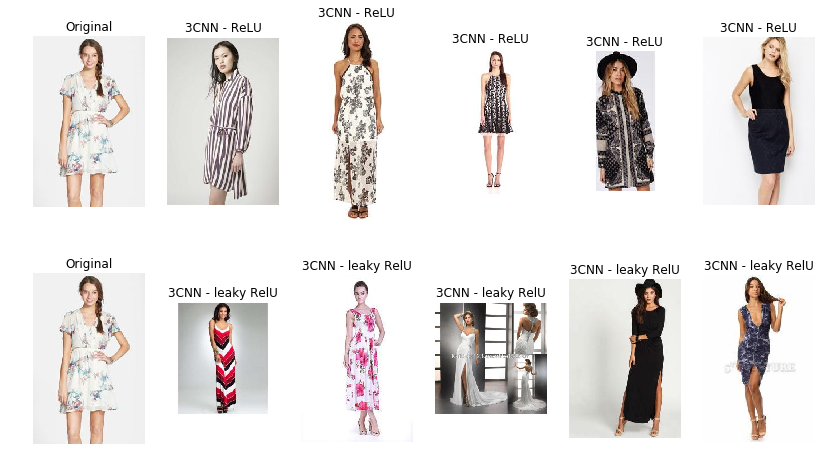

In [91]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted8, 
               tree1=tree4, tree2=tree8, label1='3CNN - ReLU', label2='3CNN - leaky RelU')

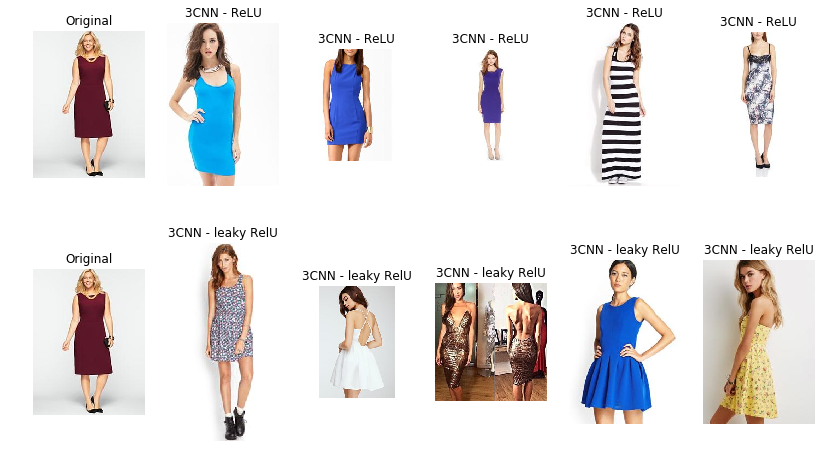

In [92]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted8, 
               tree1=tree4, tree2=tree8, label1='3CNN - ReLU', label2='3CNN - leaky RelU')

In [93]:
# update model_comparison dataframe
mod8 = {'model':'model8 - 3 hidden layers - leaky ReLu', 'img0':4, 'img1':1, 'img2':2, 'img3':1, 'img4':1}
model_comparison = model_comparison.append(mod8, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1
6,model6 - 3 hidden layers - 256 neurons/layer,2,1,2,2,1
7,model7 - 3 hidden layers - 5x5 kernel,1,2,4,1,1
8,model8 - 3 hidden layers - leaky ReLu,4,1,2,1,1


Model with 3 hidden layers (128 neurons per layer, 3x3 kernel and ReLU activation function) produced the best results so far (the only with at least two satisfying results per dress). I will no see if the results will be improved if I add two more dense layers to it. Again I will reuse the model and freeze its layers to only perform training on new added layers.

In [94]:
# define a model
model9 = Sequential(model4.layers[:-1])
model9.add(Dense(128, activation='relu'))
model9.add(Dense(64,activation='relu'))
model9.add(Dense(38, activation='sigmoid'))

# freeze layers from the first model
for layer in model9.layers[:-3]:
    layer.trainable = False

In [95]:
# compile model
model9.compile(optimizer='adam', loss='binary_crossentropy',
              metrics = ['accuracy'])

In [96]:
# train the model
start = timer()
history = model9.fit_generator(train_generator, steps_per_epoch=10, epochs=20, 
                     validation_data=validation_generator, validation_steps=5)

end = timer()
print('Model#9 trained in ',timedelta(seconds=end-start))

Epoch 1/20
10/10 [==============================] - ETA: 9s - loss: 0.6950 - accuracy: 0.43 - ETA: 6s - loss: 0.6826 - accuracy: 0.56 - ETA: 5s - loss: 0.6652 - accuracy: 0.59 - ETA: 4s - loss: 0.6464 - accuracy: 0.61 - ETA: 3s - loss: 0.6278 - accuracy: 0.64 - ETA: 2s - loss: 0.6119 - accuracy: 0.65 - ETA: 2s - loss: 0.5986 - accuracy: 0.66 - ETA: 1s - loss: 0.5855 - accuracy: 0.67 - ETA: 0s - loss: 0.5720 - accuracy: 0.68 - 10s 994ms/step - loss: 0.5581 - accuracy: 0.6929 - val_loss: 0.4034 - val_accuracy: 0.7765
Epoch 2/20
10/10 [==============================] - ETA: 5s - loss: 0.3949 - accuracy: 0.77 - ETA: 4s - loss: 0.3931 - accuracy: 0.78 - ETA: 4s - loss: 0.3799 - accuracy: 0.80 - ETA: 3s - loss: 0.3683 - accuracy: 0.81 - ETA: 3s - loss: 0.3536 - accuracy: 0.82 - ETA: 2s - loss: 0.3436 - accuracy: 0.83 - ETA: 1s - loss: 0.3322 - accuracy: 0.84 - ETA: 1s - loss: 0.3224 - accuracy: 0.85 - ETA: 0s - loss: 0.3140 - accuracy: 0.86 - 11s 1s/step - loss: 0.3045 - accuracy: 0.8761 - v

10/10 [==============================] - ETA: 7s - loss: 0.1808 - accuracy: 0.94 - ETA: 6s - loss: 0.1931 - accuracy: 0.94 - ETA: 5s - loss: 0.1927 - accuracy: 0.94 - ETA: 4s - loss: 0.1969 - accuracy: 0.94 - ETA: 3s - loss: 0.1965 - accuracy: 0.94 - ETA: 3s - loss: 0.1923 - accuracy: 0.94 - ETA: 2s - loss: 0.1925 - accuracy: 0.94 - ETA: 1s - loss: 0.1905 - accuracy: 0.94 - ETA: 0s - loss: 0.1913 - accuracy: 0.94 - 12s 1s/step - loss: 0.1919 - accuracy: 0.9452 - val_loss: 0.1658 - val_accuracy: 0.9487
Epoch 17/20
10/10 [==============================] - ETA: 7s - loss: 0.2010 - accuracy: 0.94 - ETA: 6s - loss: 0.2152 - accuracy: 0.94 - ETA: 5s - loss: 0.2096 - accuracy: 0.94 - ETA: 5s - loss: 0.2019 - accuracy: 0.94 - ETA: 4s - loss: 0.2031 - accuracy: 0.94 - ETA: 3s - loss: 0.2073 - accuracy: 0.94 - ETA: 2s - loss: 0.2048 - accuracy: 0.94 - ETA: 1s - loss: 0.2036 - accuracy: 0.94 - ETA: 0s - loss: 0.2043 - accuracy: 0.94 - 12s 1s/step - loss: 0.2025 - accuracy: 0.9421 - val_loss: 0.21

In [97]:
predicted9 = model9.predict_generator(test_generator)

In [98]:
tree9 = BallTree(predicted9)

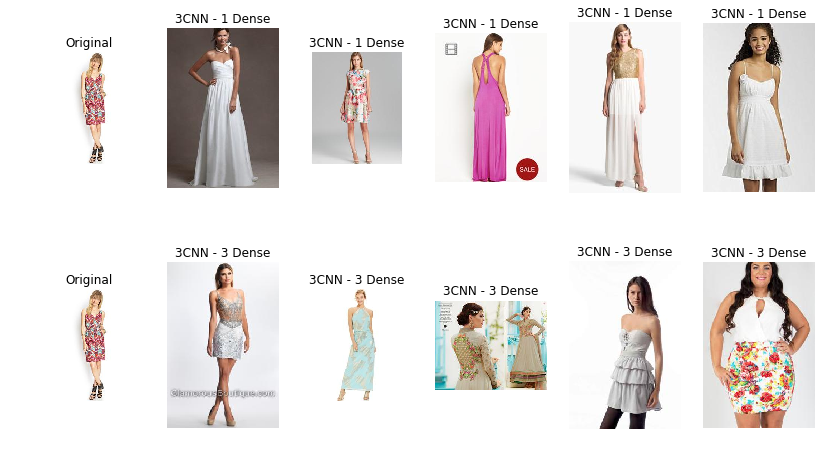

In [99]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted9, 
               tree1=tree4, tree2=tree9, label1='3CNN - 1 Dense', label2='3CNN - 3 Dense')

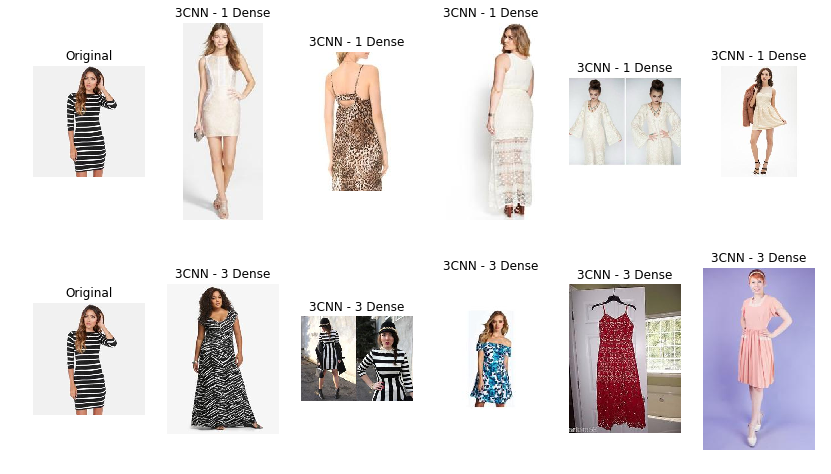

In [100]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted9, 
               tree1=tree4, tree2=tree9, label1='3CNN - 1 Dense', label2='3CNN - 3 Dense')

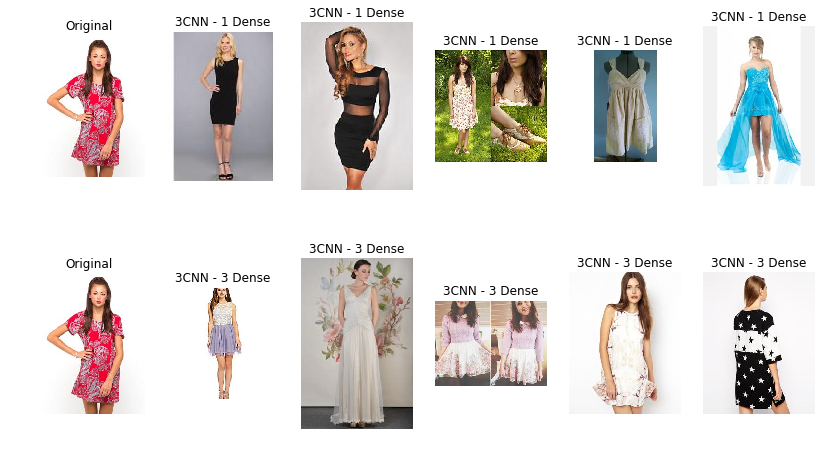

In [101]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted9, 
               tree1=tree4, tree2=tree9, label1='3CNN - 1 Dense', label2='3CNN - 3 Dense')

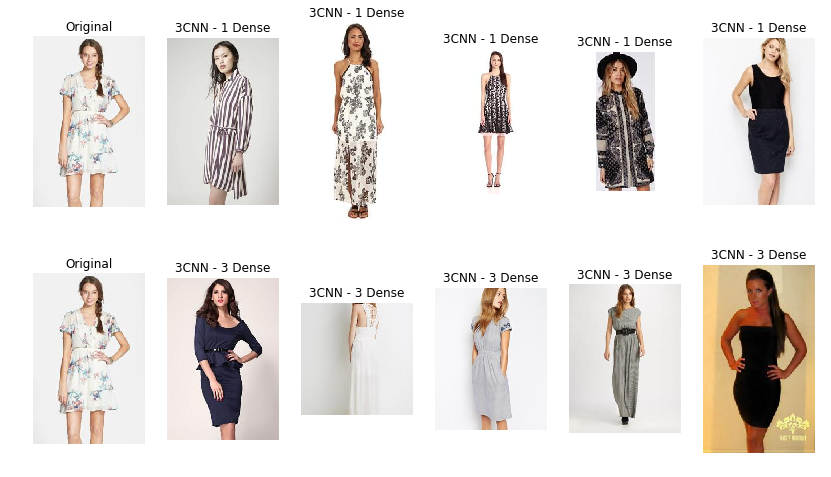

In [102]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted9, 
               tree1=tree4, tree2=tree9, label1='3CNN - 1 Dense', label2='3CNN - 3 Dense')

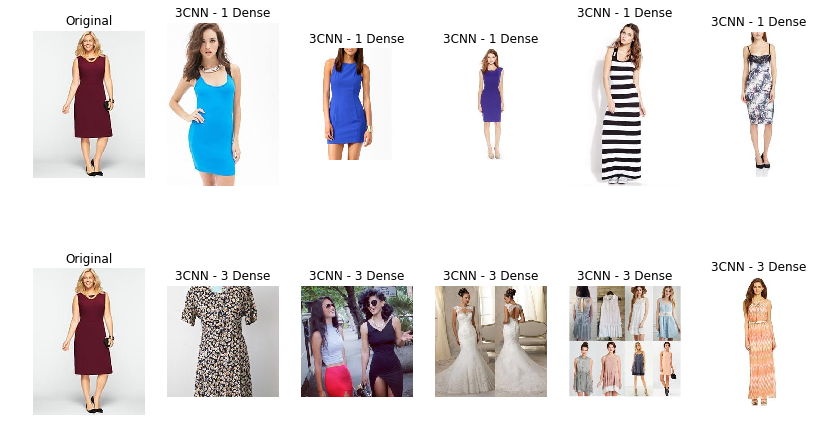

In [103]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted9, 
               tree1=tree4, tree2=tree9, label1='3CNN - 1 Dense', label2='3CNN - 3 Dense')

In [104]:
# update model_comparison dataframe
mod9 = {'model':'model9 - 3 hidden layers - 2 Dense', 'img0':1, 'img1':1, 'img2':3, 'img3':1, 'img4':1}
model_comparison = model_comparison.append(mod9, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1
6,model6 - 3 hidden layers - 256 neurons/layer,2,1,2,2,1
7,model7 - 3 hidden layers - 5x5 kernel,1,2,4,1,1
8,model8 - 3 hidden layers - leaky ReLu,4,1,2,1,1
9,model9 - 3 hidden layers - 2 Dense,1,1,3,1,1


Model might not be generalizing too well as it is only looking for specific attributes. Instead of using the last output layer I will use the features of the pre-last dense layer and compare results.

In [105]:
model10 = keras.Model(inputs=model9.input, outputs=model9.layers[11].output)

In [106]:
predicted10 = model10.predict_generator(test_generator)

In [107]:
tree10 = BallTree(predicted10)

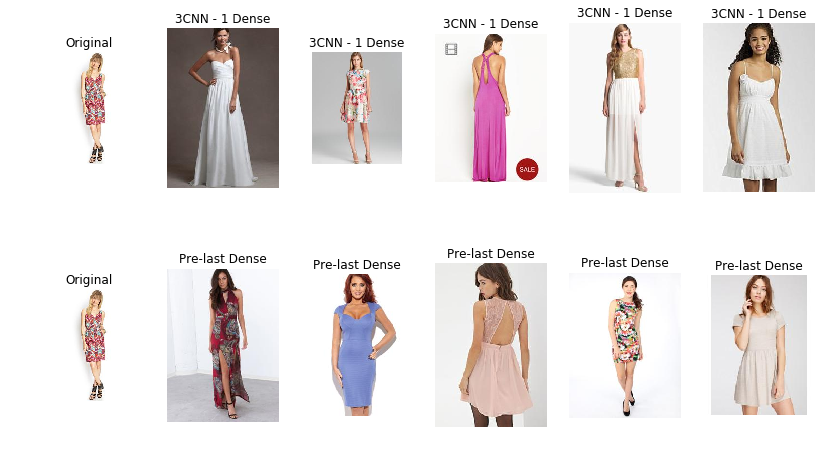

In [108]:
i = int(images[0])
compare_models(i, predicted1=predicted4, predicted2=predicted10, 
               tree1=tree4, tree2=tree10, label1='3CNN - 1 Dense', label2='Pre-last Dense')

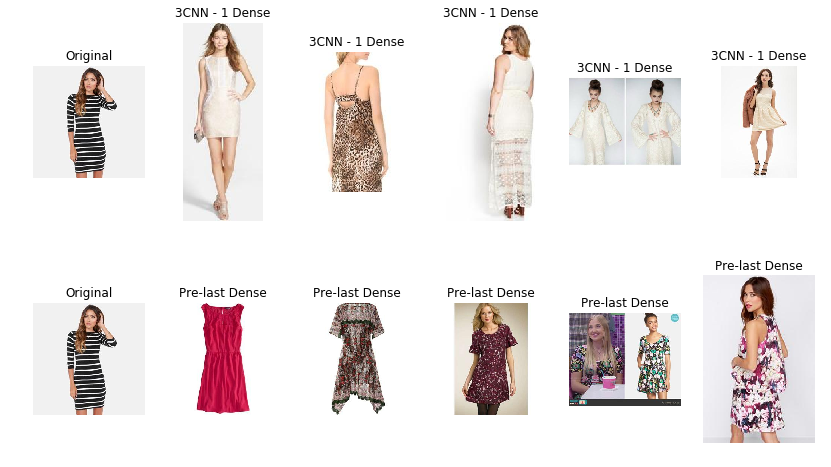

In [109]:
i = int(images[1])
compare_models(i, predicted1=predicted4, predicted2=predicted10, 
               tree1=tree4, tree2=tree10, label1='3CNN - 1 Dense', label2='Pre-last Dense')

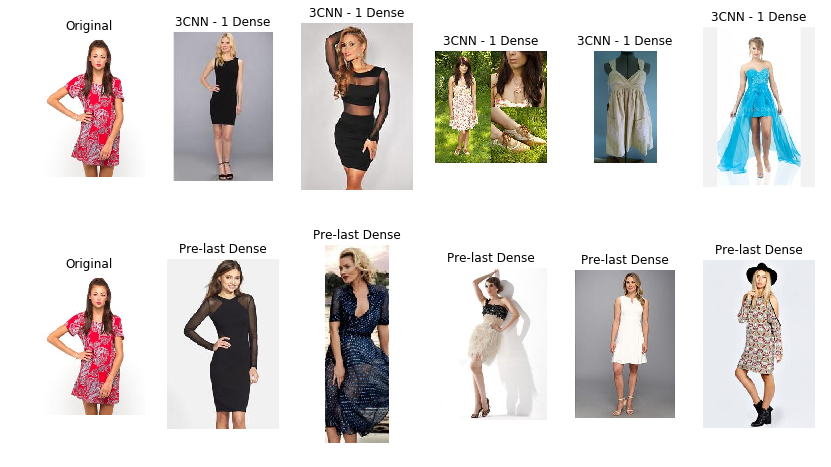

In [110]:
i = int(images[2])
compare_models(i, predicted1=predicted4, predicted2=predicted10, 
               tree1=tree4, tree2=tree10, label1='3CNN - 1 Dense', label2='Pre-last Dense')

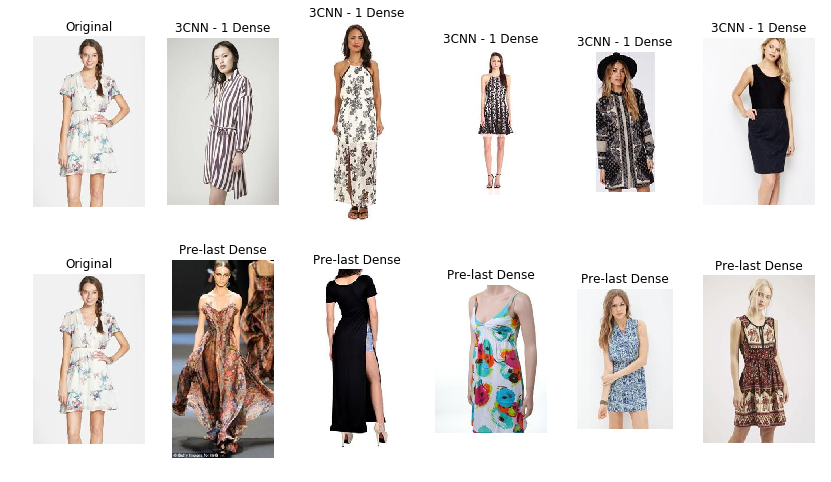

In [111]:
i = int(images[3])
compare_models(i, predicted1=predicted4, predicted2=predicted10, 
               tree1=tree4, tree2=tree10, label1='3CNN - 1 Dense', label2='Pre-last Dense')

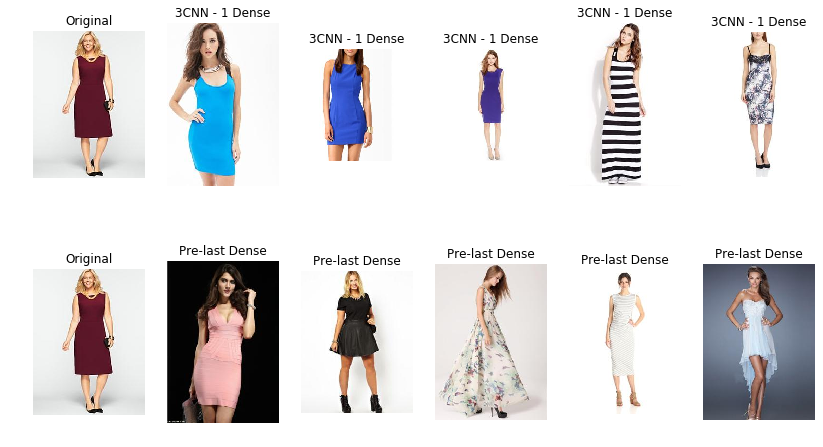

In [112]:
i = int(images[4])
compare_models(i, predicted1=predicted4, predicted2=predicted10, 
               tree1=tree4, tree2=tree10, label1='3CNN - 1 Dense', label2='Pre-last Dense')

In [113]:
# update model_comparison dataframe
mod10 = {'model':'model10 - 3 hidden layers - Pre-Last Dense Output', 'img0':3, 'img1':0, 'img2':2, 'img3':3, 'img4':1}
model_comparison = model_comparison.append(mod10, ignore_index=True)
model_comparison

,model,img0,img1,img2,img3,img4
0,image_index,6051,11157,11563,2986,3357
1,model1 - 1 hidden layer - no weights,3,0,3,3,1
2,model2 - 1 hidden layer - with class weights,2,1,3,2,1
3,model3 - 2 hidden layers - no weights,2,1,2,3,2
4,model4 - 3 hidden layers - no weights,2,2,2,3,2
5,model5 - 4 hidden layers - no weights,3,2,2,1,1
6,model6 - 3 hidden layers - 256 neurons/layer,2,1,2,2,1
7,model7 - 3 hidden layers - 5x5 kernel,1,2,4,1,1
8,model8 - 3 hidden layers - leaky ReLu,4,1,2,1,1
9,model9 - 3 hidden layers - 2 Dense,1,1,3,1,1


After all different variations, the model with 3 hidden convolutional layers, 128 neurons per layer, 3x3 kernel and ReLU activation function at each level, showed the best results on test data. I am saving this model and will use it for comparison with similar model trained on high res images and the one using pretrained coputer vision models. 

In [114]:
directory = 'data/models/'
if not os.path.isdir(directory):
    os.mkdir(directory)
model4.save(directory+'CNN_trained_on_low_res_images.h5')

I will now use this model to make predictions for test datasets. We already have predictions for test part of the dataset. These are stored in prediced4 variable.

Now I will use model4 to get feature prediction from small and large datasets that are unlabeled. 

In [133]:
test_images_small = np.ndarray((len(test_dresses_small),300,200,3))
for i in range(len(test_dresses_small)):
    img = Image.open('data/test_dresses_small/img'+str(i)+'.png')
    img = img.convert('RGB')
    img = img.resize((200,300))
    test_images_small[i,:,:,:]=np.asarray(img)
    del img
test_images_small = test_images_small / 255

predicted_small = model4.predict(test_images_small)

In [142]:
# predict features for small test set
predicted_small = []
directory = 'data/test_dresses_small/'
for i in range(len(test_dresses_small)):
    image_path = directory + 'img' + str(i) + '.png'
    img = image.load_img(image_path, target_size=(300,200))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)/255
    pred = model4.predict(img)
    flat_pred = pred.flatten()
    predicted_small.append(flat_pred)

In [145]:
# predict features for large test set
predicted_large = []
directory = 'data/test_dresses_large/'
for i in range(len(test_dresses_large)):
    image_path = directory + 'img' + str(i) + '.png'
    img = image.load_img(image_path, target_size=(300,200))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)/255
    pred = model3.predict(img)
    flat_pred = pred.flatten()
    predicted_large.append(flat_pred)

Save all predictions to be reused for unsupervised algorithms.

In [148]:
# create a directory
directory = 'data/predictions/'
if not os.path.isdir(directory):
    os.mkdir(directory)

np.save(directory+'test_predictions_lr.npy', predicted4)
np.save(directory+'small_predictions_lr.npy', np.asarray(predicted_small))
np.save(directory+'large_predictions_lr.npy', np.asarray(predicted_large))

In [121]:
notebook_end = timer()
print(timedelta(seconds=notebook_end-notebook_start))

3:31:44.480994
